#**Q1**

In [3]:
# Import common libraries for data processing and ML

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

uploading files in colab from pc

In [4]:

from google.colab import files # Colab-specific library to load files

uploaded = files.upload() # Upload file; here we will upload Parkinson's data

# NOTE: load BOTH train_data and test_data csv files

# Confirm upload
for fn in uploaded.keys():
  print('You uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving winequality.names to winequality.names
Saving winequality-red.csv to winequality-red.csv
Saving winequality-white.csv to winequality-white.csv
You uploaded file "winequality.names" with length 3305 bytes
You uploaded file "winequality-red.csv" with length 84199 bytes
You uploaded file "winequality-white.csv" with length 264426 bytes


reading data from files

In [5]:
# Display header and a few rows

red_wine_data = pd.read_csv('winequality-red.csv', delimiter=';')
display(red_wine_data)

white_wine_data = pd.read_csv('winequality-white.csv', delimiter=';')
display(white_wine_data)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [6]:
print(red_wine_data.dtypes) # Data types
print(white_wine_data.dtypes)  # Data types to cross-check with train

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object
fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object


spliting data into 2 patrs train and test


In [7]:
from sklearn.model_selection import train_test_split

# Splitting data into training and testing sets
R_train,R_test = train_test_split(red_wine_data, test_size=0.2, random_state=42)
W_train,W_test = train_test_split(white_wine_data, test_size=0.2, random_state=42)


For Red Wine

In [8]:
for col in R_train.columns.values: # For each column
  list_vals = pd.unique(R_train[col])    # Create a list of unique values
  print(col + ' is of type ' + str(R_train[col].dtypes) + ', has ' + str(len(list_vals)) + ' unique values, and ' + str(np.sum(pd.isnull(R_train[col]))) + ' null entries')
  if len(list_vals) < 10: # If the column has less than 10 unique values then print them
    list_str = ''
    for n_value in range(0,len(list_vals)):
      list_str = list_str + str(list_vals[n_value]) + ', '
    print('  These are: '+list_str[0:len(list_str)-2])

fixed acidity is of type float64, has 91 unique values, and 0 null entries
volatile acidity is of type float64, has 138 unique values, and 0 null entries
citric acid is of type float64, has 79 unique values, and 0 null entries
residual sugar is of type float64, has 82 unique values, and 0 null entries
chlorides is of type float64, has 143 unique values, and 0 null entries
free sulfur dioxide is of type float64, has 57 unique values, and 0 null entries
total sulfur dioxide is of type float64, has 139 unique values, and 0 null entries
density is of type float64, has 386 unique values, and 0 null entries
pH is of type float64, has 86 unique values, and 0 null entries
sulphates is of type float64, has 92 unique values, and 0 null entries
alcohol is of type float64, has 60 unique values, and 0 null entries
quality is of type int64, has 6 unique values, and 0 null entries
  These are: 6, 5, 4, 7, 8, 3


For White Wine :

In [9]:

for col in W_train.columns.values: # For each column
  list_vals = pd.unique(W_train[col])    # Create a list of unique values
  print(col + ' is of type ' + str(W_train[col].dtypes) + ', has ' + str(len(list_vals)) + ' unique values, and ' + str(np.sum(pd.isnull(W_train[col]))) + ' null entries')
  if len(list_vals) < 10: # If the column has less than 10 unique values then print them
    list_str = ''
    for n_value in range(0,len(list_vals)):
      list_str = list_str + str(list_vals[n_value]) + ', '
    print('  These are: '+list_str[0:len(list_str)-2])


fixed acidity is of type float64, has 66 unique values, and 0 null entries
volatile acidity is of type float64, has 118 unique values, and 0 null entries
citric acid is of type float64, has 83 unique values, and 0 null entries
residual sugar is of type float64, has 295 unique values, and 0 null entries
chlorides is of type float64, has 147 unique values, and 0 null entries
free sulfur dioxide is of type float64, has 123 unique values, and 0 null entries
total sulfur dioxide is of type float64, has 242 unique values, and 0 null entries
density is of type float64, has 846 unique values, and 0 null entries
pH is of type float64, has 102 unique values, and 0 null entries
sulphates is of type float64, has 74 unique values, and 0 null entries
alcohol is of type float64, has 94 unique values, and 0 null entries
quality is of type int64, has 7 unique values, and 0 null entries
  These are: 6, 5, 7, 3, 4, 8, 9


In [10]:
# Data exploration and visualization
print("red wine \n")
print(R_train.describe())
print(R_train.info())
print("---------------------------------------------------------------------------------\n")
print("white wine \n")
print(W_train.describe())
print(W_train.info())

red wine 

       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1279.000000       1279.000000  1279.000000     1279.000000   
mean        8.323690          0.530559     0.272471        2.555473   
std         1.724243          0.179275     0.195448        1.435790   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.400000     0.100000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.430000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1279.000000          1279.000000           1279.000000  1279.000000   
mean      0.088448            15.876075             46.657154     0.996774   
std       0.049332            10.313517             32.941962     0.001856   
min       0.012000             1.0000

##Data Pre-processing for Red Wine

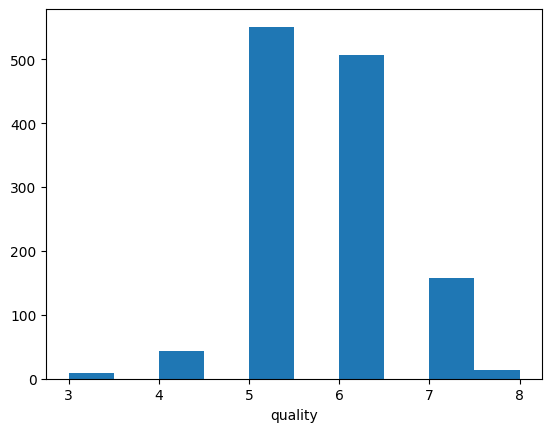

In [11]:

for col in R_train.columns.values: # for all columns
  # if the values are integers or discrete
  if (R_train[col].dtypes == 'int64') | (R_train[col].dtypes == 'object'):
    plt.hist(R_train[col])
    plt.xlabel(col)
    plt.show()

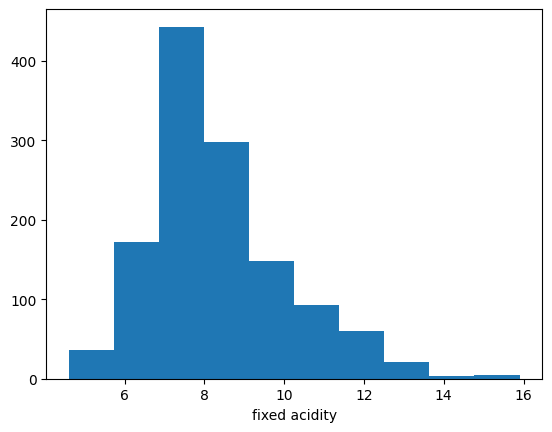

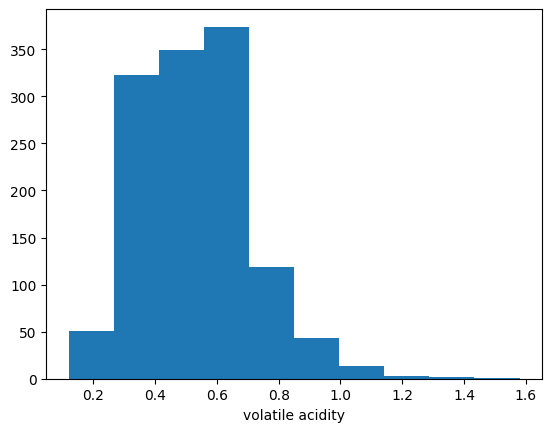

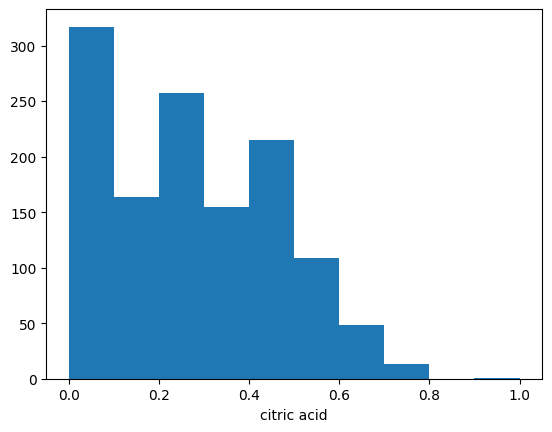

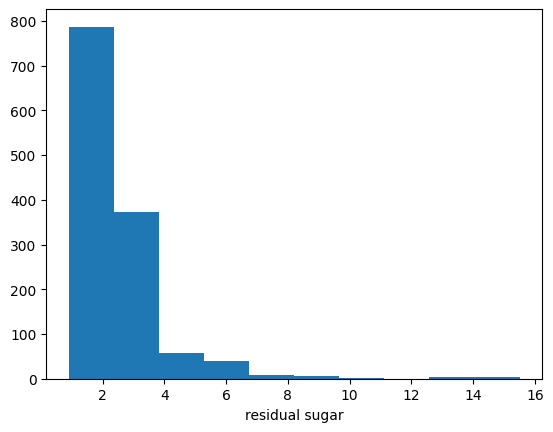

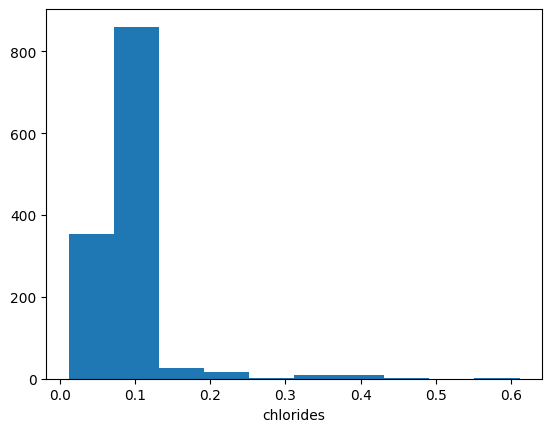

...

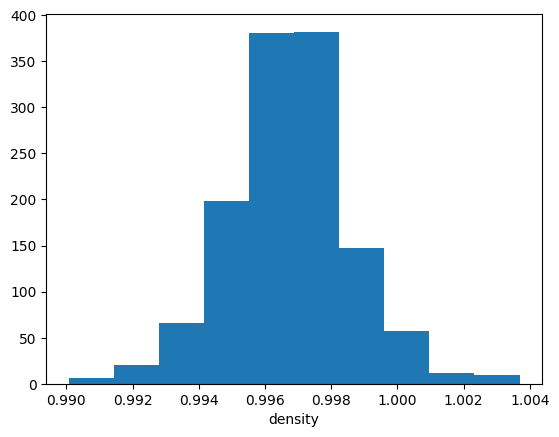

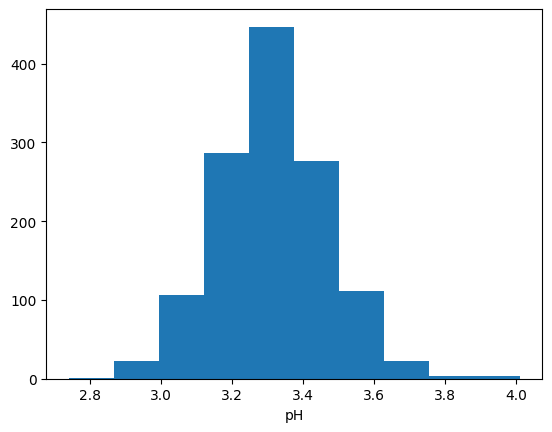

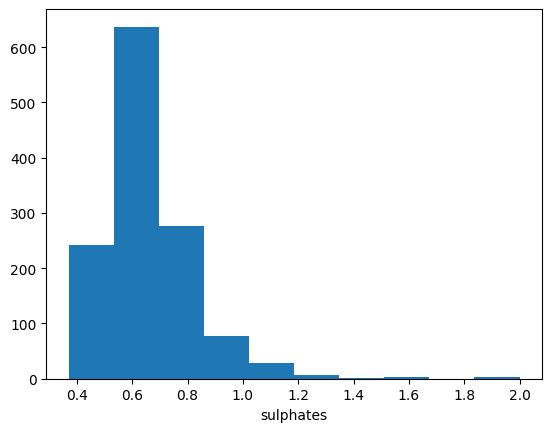

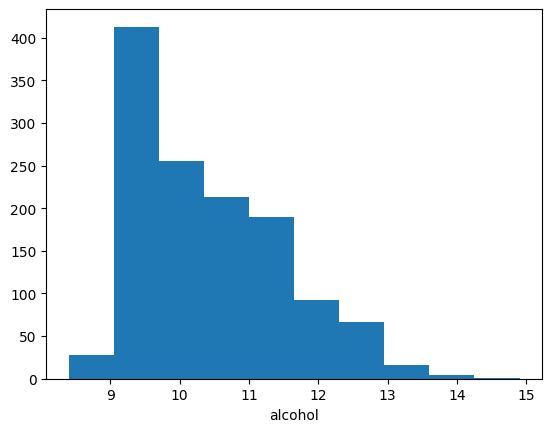

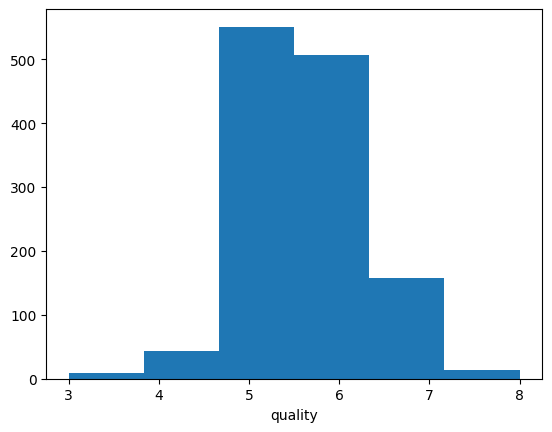

In [12]:
# Plot histograms for continuous variables

for col in R_train.columns.values:
  if (R_train[col].dtypes == 'int64') | (R_train[col].dtypes == 'float64'):
    plt.hist(R_train[col],10 if len(pd.unique(R_train[col]))>20 else len(pd.unique(R_train[col])))
    plt.xlabel(col)
    plt.show()

array([[<Axes: xlabel='fixed acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='citric acid', ylabel='fixed acidity'>,
        <Axes: xlabel='residual sugar', ylabel='fixed acidity'>,
        <Axes: xlabel='chlorides', ylabel='fixed acidity'>,
        <Axes: xlabel='free sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='total sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='density', ylabel='fixed acidity'>,
        <Axes: xlabel='pH', ylabel='fixed acidity'>,
        <Axes: xlabel='sulphates', ylabel='fixed acidity'>,
        <Axes: xlabel='alcohol', ylabel='fixed acidity'>,
        <Axes: xlabel='quality', ylabel='fixed acidity'>],
       [<Axes: xlabel='fixed acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='citric acid', ylabel='volatile acidity'>,
        <Axes: xlabel='residual sugar', ylabel='vol

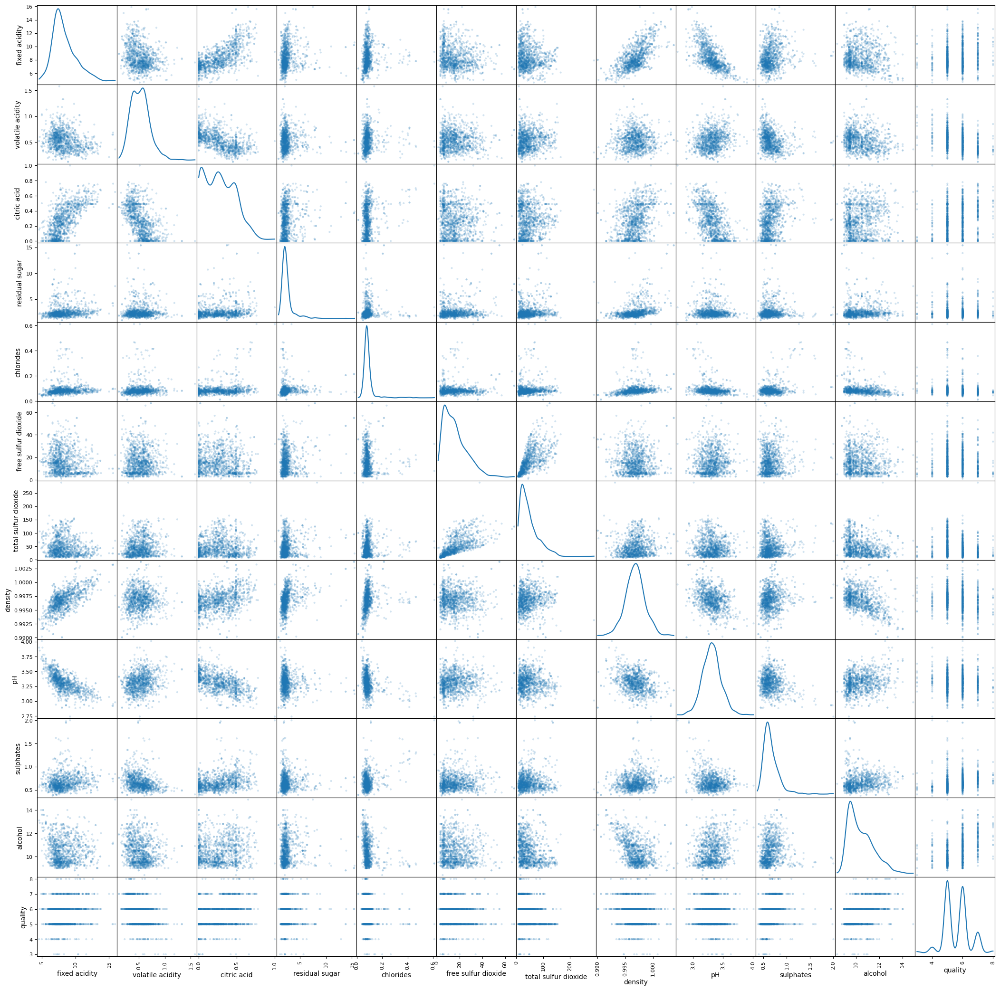

In [13]:
# We can also plot pair-wise scatter matrices (lazy coding)

from pandas.plotting import scatter_matrix
scatter_matrix(R_train, alpha=0.2, figsize=(26, 26), diagonal='kde') # kde is kernel density estimation

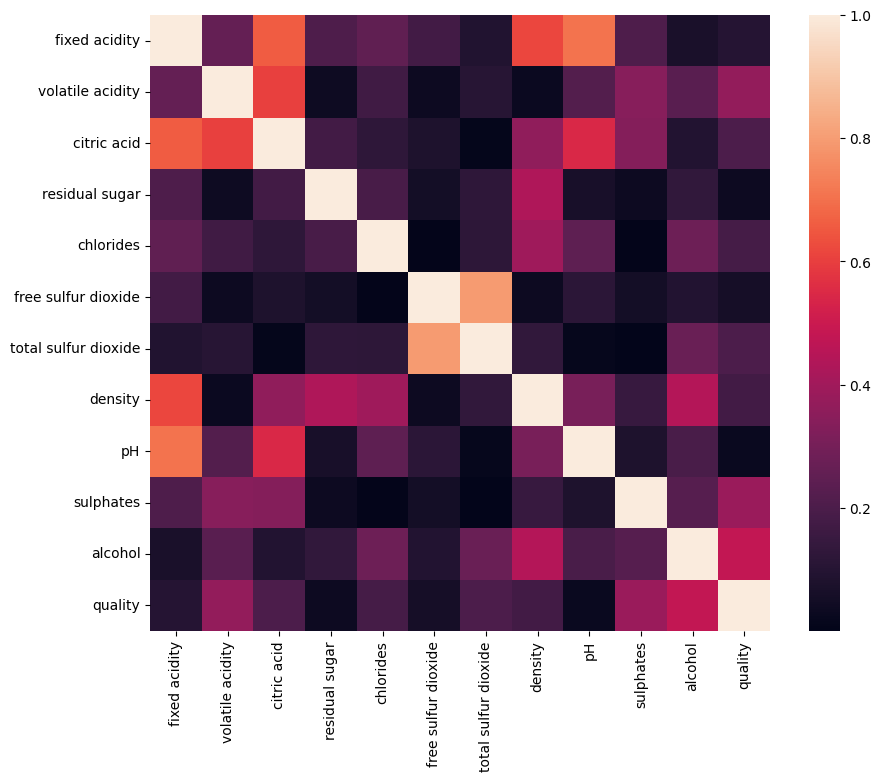

In [14]:
corrMatrix = R_train.corr(method='spearman') # Use spearman for non-linear
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(abs(corrMatrix), annot=False) # Show absolute value
plt.show()

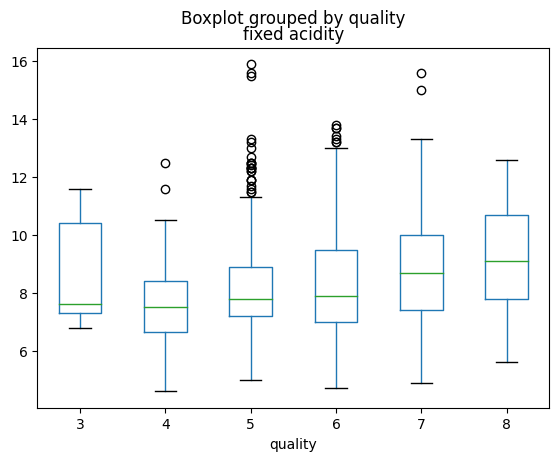

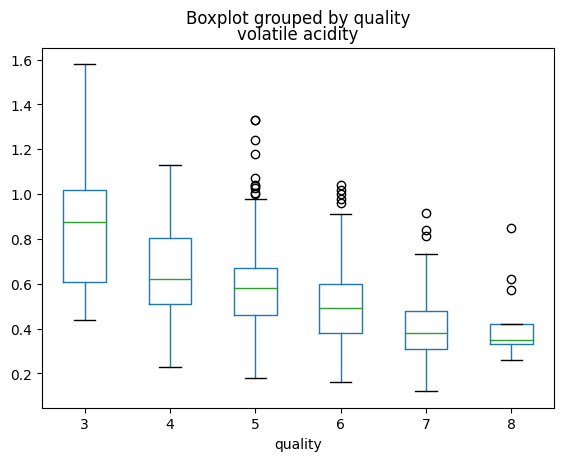

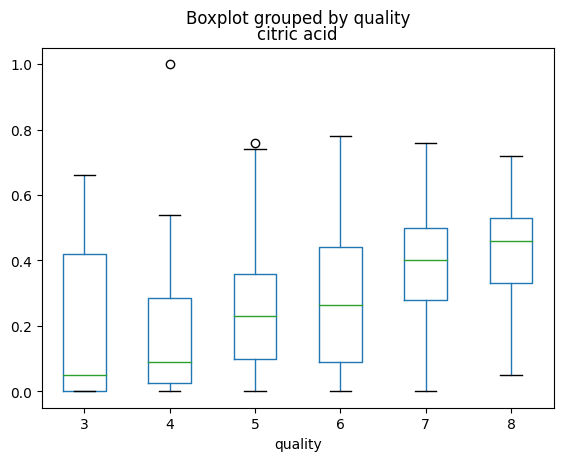

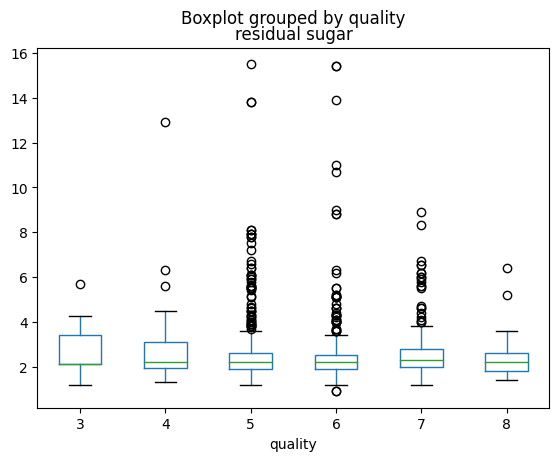

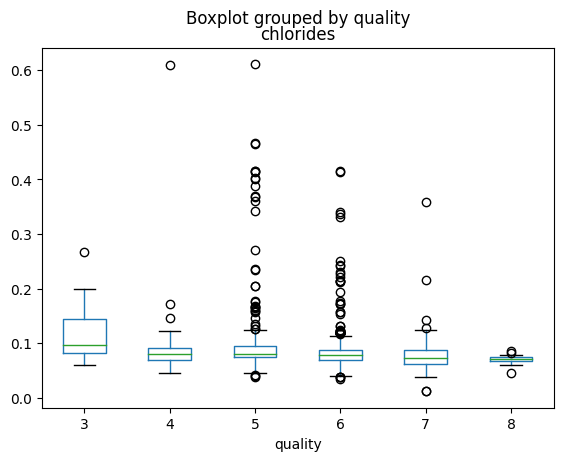

...

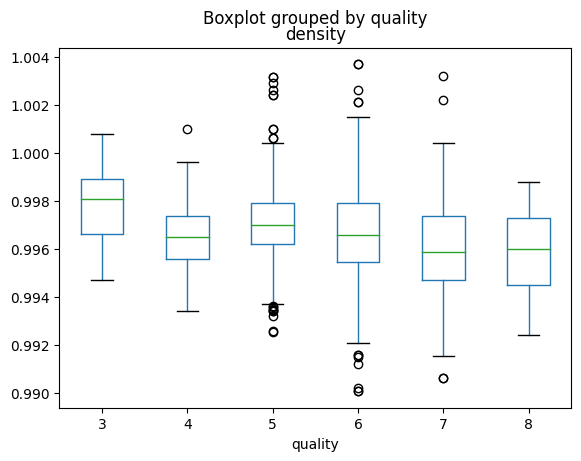

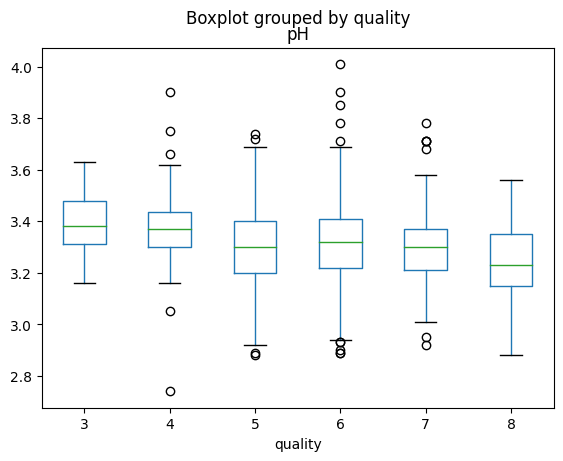

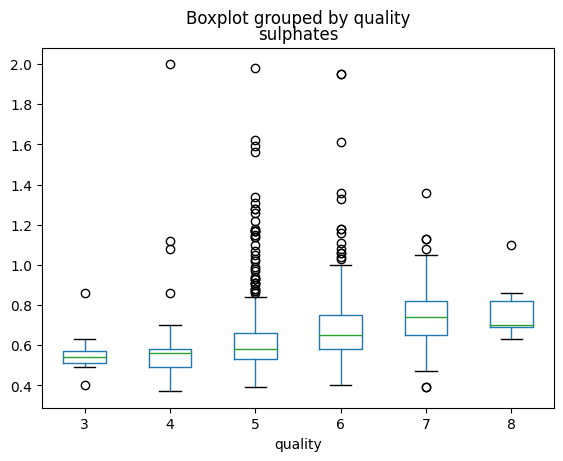

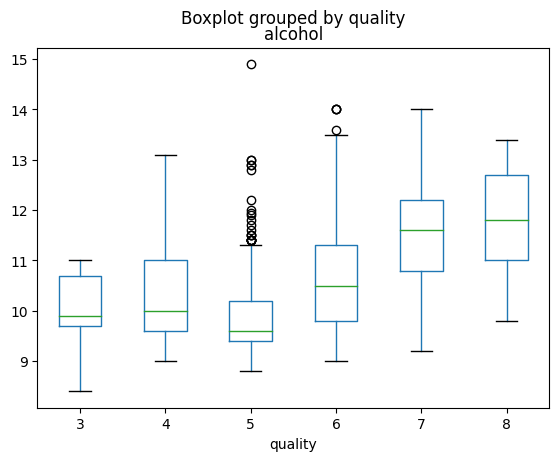

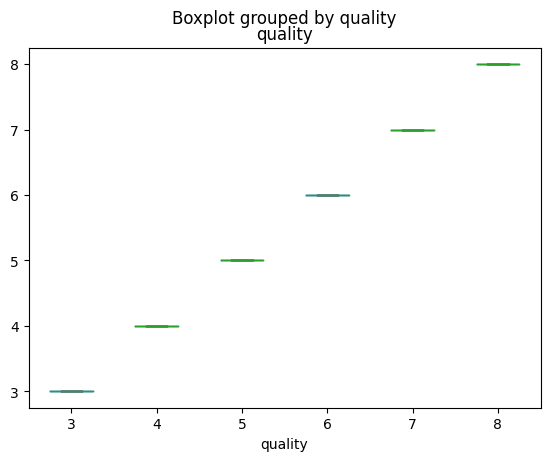

In [15]:
# Plot side-by-side boxplot for each variable to find which ones are likely to help predict classes

for col in R_train.columns.values:
  R_train.boxplot(by='quality', column=col,grid=False)

spliting training data into input X and target y

,0,1,2,3,4,5,6,7,8,9,10
0,0.218332,0.889712,0.192092,0.309726,-0.049642,0.691007,1.042934,1.846696,1.093500,0.458223,1.123177
1,-1.290166,-1.788783,0.652753,-0.805080,-0.455214,2.388473,3.593870,-3.004491,-0.400439,-0.401197,1.408272
2,1.494753,-0.784347,1.011045,-0.526378,0.599272,-0.957960,-0.991742,0.768655,-0.075669,0.515517,-0.587390
3,0.276351,0.861811,-0.063831,-0.665729,-0.009085,0.012020,-0.718427,0.089488,0.054238,-1.088733,-0.967516
4,0.044274,2.814880,-0.626861,2.399985,-0.313264,-0.472970,0.222990,1.199871,0.379008,-0.974144,-0.492358
...,...,...,...,...,...,...,...,...,...,...,...
1274,0.450408,0.387494,-1.394630,-0.456703,-0.617442,-1.054958,-1.113215,0.499144,-0.855116,-0.172018,-0.017201
1275,-0.071764,0.582801,-0.882784,-0.317352,-0.313264,0.885003,0.405199,-0.212363,-0.140623,0.515517,0.457957
1276,-0.651956,0.499098,-1.087522,0.100700,-0.232149,-0.084978,1.164407,0.369779,1.288361,-0.687670,-0.872484
1277,-0.245822,-1.844584,0.396831,-0.596054,-0.698557,-0.860962,-0.961374,-1.182601,0.054238,0.801991,1.408272


0    -1.111091e-16
1     4.117981e-16
2     1.263866e-16
3     1.527750e-17
4    -1.041648e-16
5    -7.638751e-17
6    -7.569308e-17
7     2.559398e-14
8    -1.358309e-15
9     4.152703e-16
10    4.777692e-16
dtype: float64


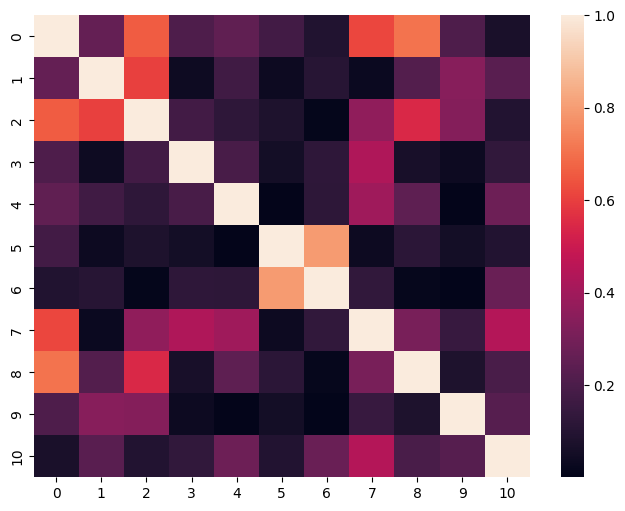

In [16]:
# Normalize data (shift and scale so that columns are zero mean and unit variance)
from sklearn import preprocessing

scaler = preprocessing.StandardScaler() # For data normalization



scaler.fit(R_train.drop(columns=['quality'])) # Compute mean and std
R_train_X = pd.DataFrame(scaler.transform(R_train.drop(columns=['quality']))) # Use mean and std
# R_train_Y = pd.DataFrame(R_train['quality'])
R_train_Y = R_train['quality']

display(R_train_X)
print(R_train_X.mean())

corrMatrix = R_train_X.corr(method='spearman') # Check correlation again
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(abs(corrMatrix), annot=False)
plt.show()

spliting test data into input X and target y

In [17]:
# Normalize test data using the same scaler that was fitted on training.

R_test_X = pd.DataFrame(scaler.transform(R_test.drop(columns=['quality'])))
# R_test_Y = pd.DataFrame(R_test['quality'])
R_test_Y = R_test['quality']

display(R_test_X)
print(R_test_X.mean())


,0,1,2,3,4,5,6,7,8,9,10
0,-0.361860,0.164286,-0.985153,-0.038651,0.518158,-0.181976,-0.019957,0.175732,-0.465393,-0.000134,-0.777453
1,-0.303841,-0.170525,-0.524492,-0.665729,-0.130756,0.497011,1.680668,-0.417191,0.508915,-1.031438,-0.872484
2,1.378715,0.778108,-0.268569,0.100700,0.376208,0.109019,-0.384376,1.954501,-0.205577,1.833295,-0.492358
3,0.102293,-0.393733,0.192092,-0.212839,-0.211871,1.563989,0.344463,0.660851,0.119192,-0.687670,-0.587390
4,-0.942051,-0.393733,-0.166200,-0.596054,-0.232149,0.206017,-0.384376,-1.064016,0.508915,-0.343902,0.172862
...,...,...,...,...,...,...,...,...,...,...,...
315,-0.884032,0.610702,-1.394630,0.100700,0.700665,-0.084978,-0.414744,-0.751384,0.833684,-0.172018,0.838083
316,-1.000070,0.554900,-1.394630,1.215505,0.092308,3.406953,0.936645,-0.643580,-0.725208,-1.203322,-0.872484
317,-0.013745,0.387494,-0.115015,-0.247677,0.599272,-0.666966,-0.262903,-0.330948,-1.049977,-0.744965,-0.587390
318,0.276351,-1.453971,0.601569,-0.387028,0.234258,0.400013,-0.596954,-0.708262,-1.049977,0.171750,0.743051


0    -0.011751
1    -0.076360
2    -0.038238
3    -0.058029
4    -0.099451
5    -0.000559
6    -0.028735
7    -0.073532
8    -0.017414
9    -0.053669
10    0.023188
dtype: float64


##Data Pre-processing for White Wine

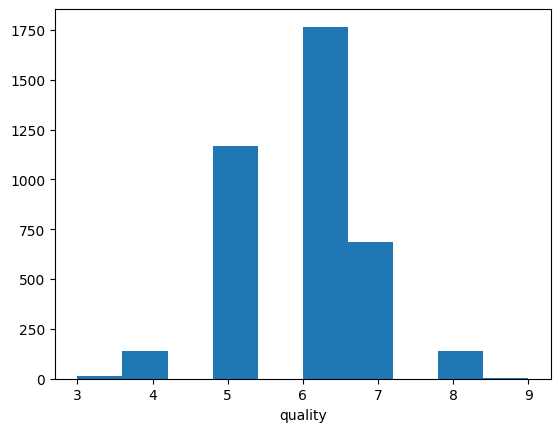

In [18]:

for col in W_train.columns.values: # for all columns
  # if the values are integers or discrete
  if (W_train[col].dtypes == 'int64') | (W_train[col].dtypes == 'object'):
    plt.hist(W_train[col])
    plt.xlabel(col)
    plt.show()

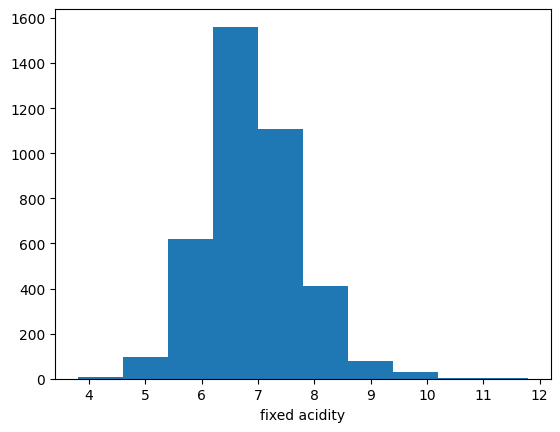

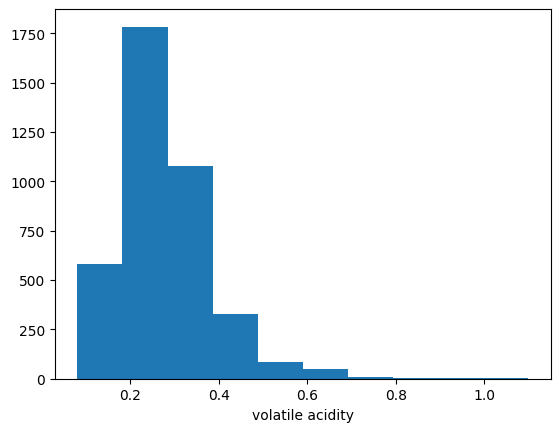

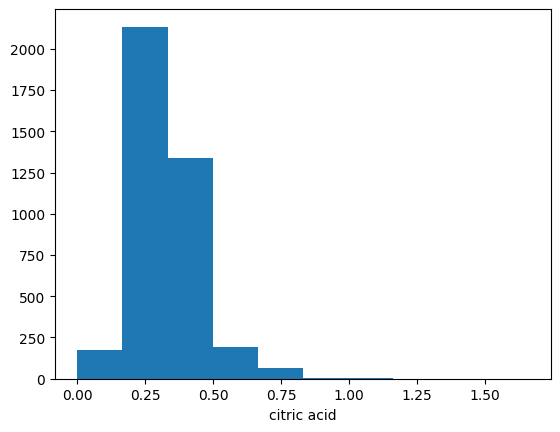

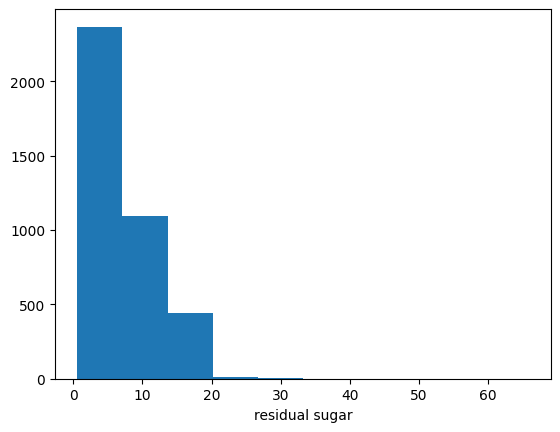

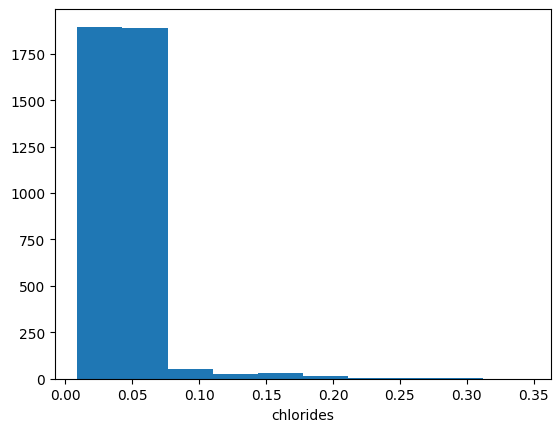

...

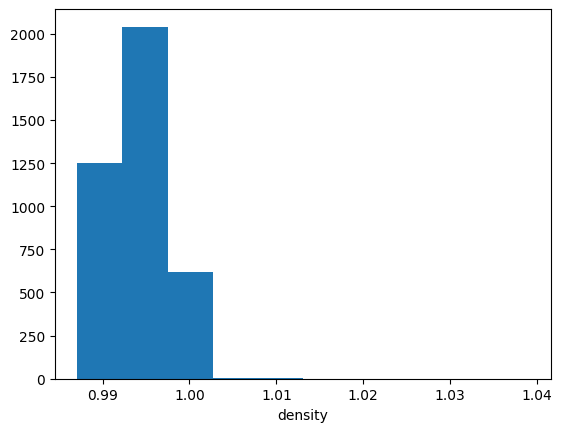

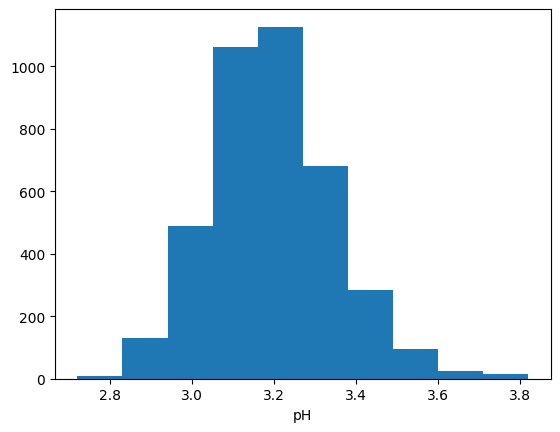

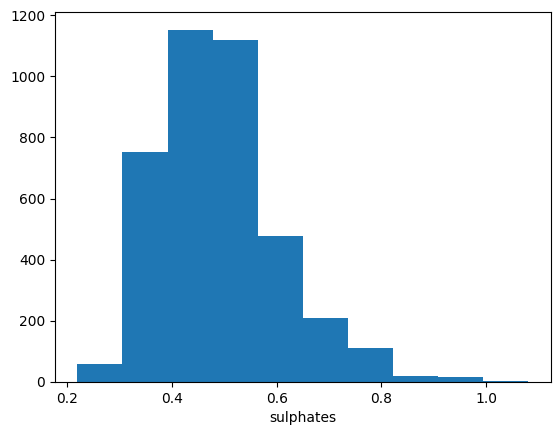

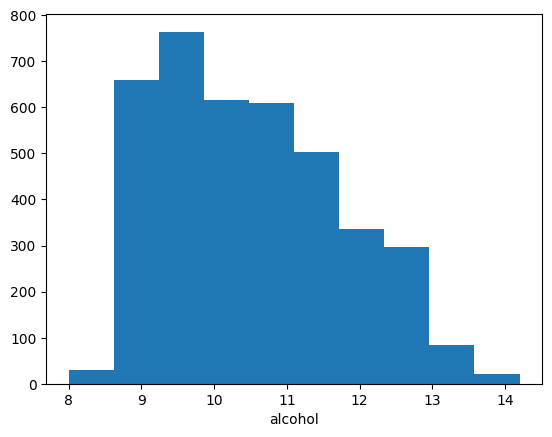

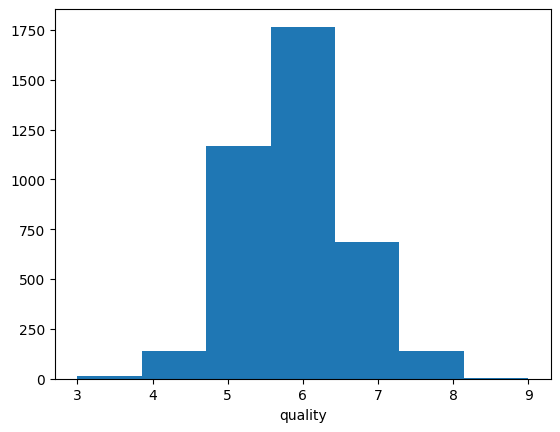

In [19]:
# Plot histograms for continuous variables

for col in W_train.columns.values:
  if (W_train[col].dtypes == 'int64') | (W_train[col].dtypes == 'float64'):
    plt.hist(W_train[col],10 if len(pd.unique(W_train[col]))>20 else len(pd.unique(W_train[col])))
    plt.xlabel(col)
    plt.show()

array([[<Axes: xlabel='fixed acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='fixed acidity'>,
        <Axes: xlabel='citric acid', ylabel='fixed acidity'>,
        <Axes: xlabel='residual sugar', ylabel='fixed acidity'>,
        <Axes: xlabel='chlorides', ylabel='fixed acidity'>,
        <Axes: xlabel='free sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='total sulfur dioxide', ylabel='fixed acidity'>,
        <Axes: xlabel='density', ylabel='fixed acidity'>,
        <Axes: xlabel='pH', ylabel='fixed acidity'>,
        <Axes: xlabel='sulphates', ylabel='fixed acidity'>,
        <Axes: xlabel='alcohol', ylabel='fixed acidity'>,
        <Axes: xlabel='quality', ylabel='fixed acidity'>],
       [<Axes: xlabel='fixed acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='volatile acidity', ylabel='volatile acidity'>,
        <Axes: xlabel='citric acid', ylabel='volatile acidity'>,
        <Axes: xlabel='residual sugar', ylabel='vol

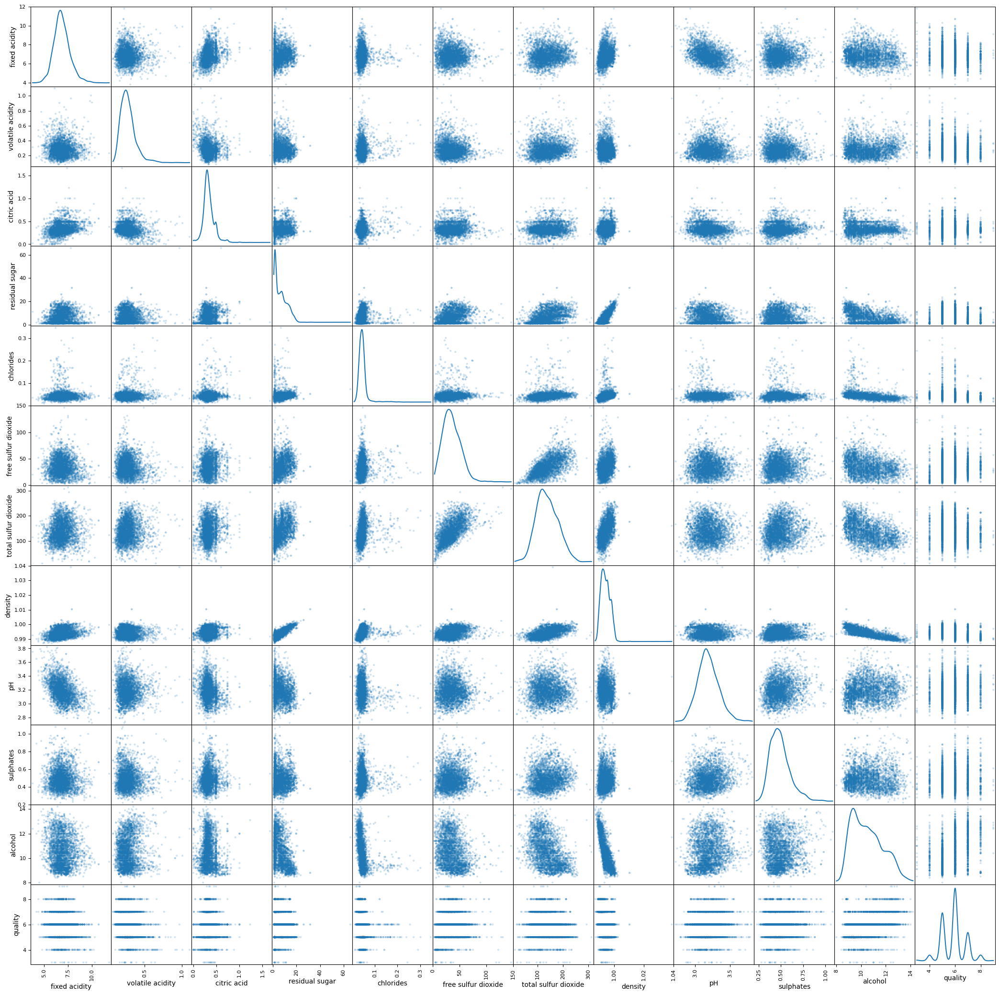

In [20]:
# We can also plot pair-wise scatter matrices (lazy coding)

from pandas.plotting import scatter_matrix
scatter_matrix(W_train, alpha=0.2, figsize=(26, 26), diagonal='kde') # kde is kernel density estimation

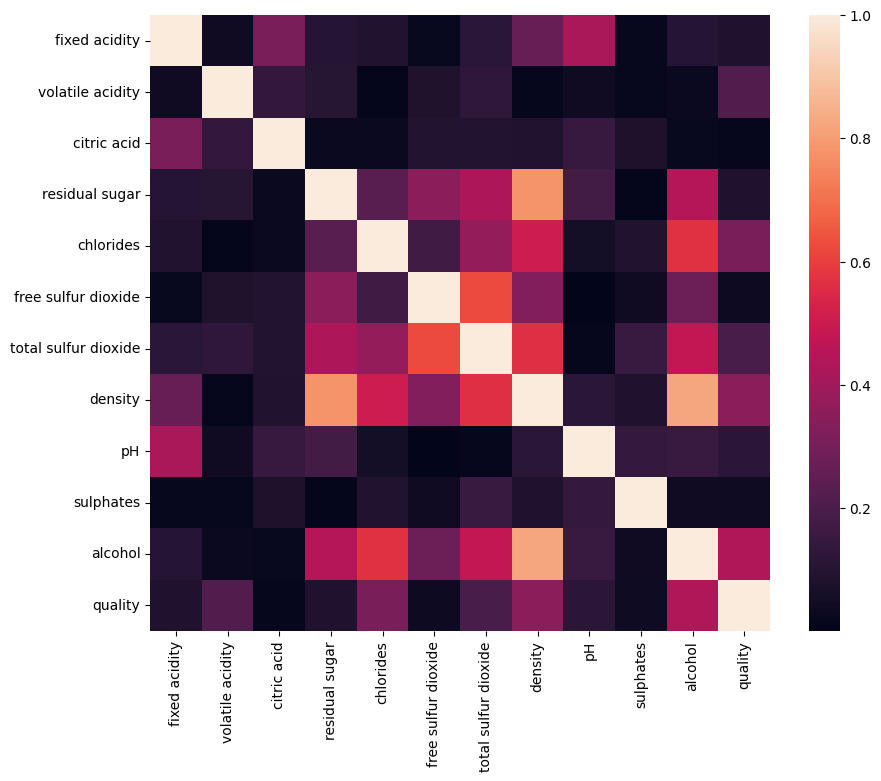

In [21]:
corrMatrix = W_train.corr(method='spearman') # Use spearman for non-linear
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(abs(corrMatrix), annot=False) # Show absolute value
plt.show()

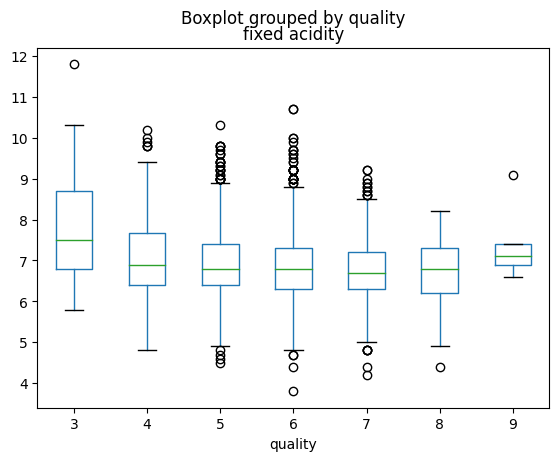

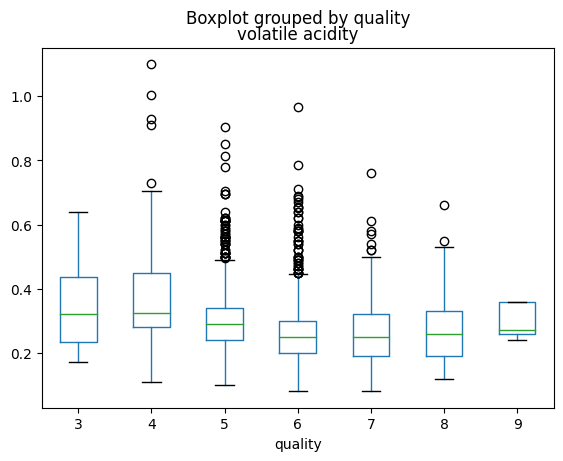

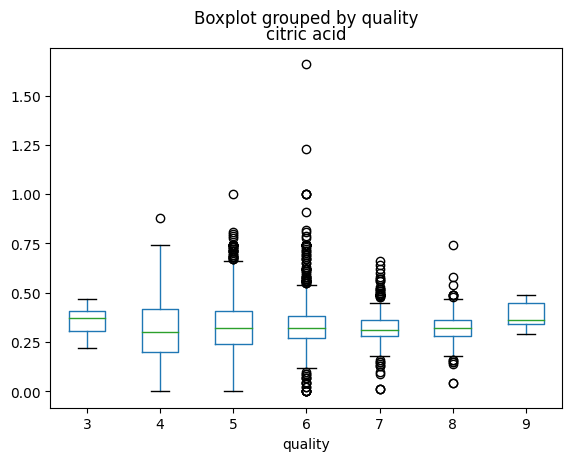

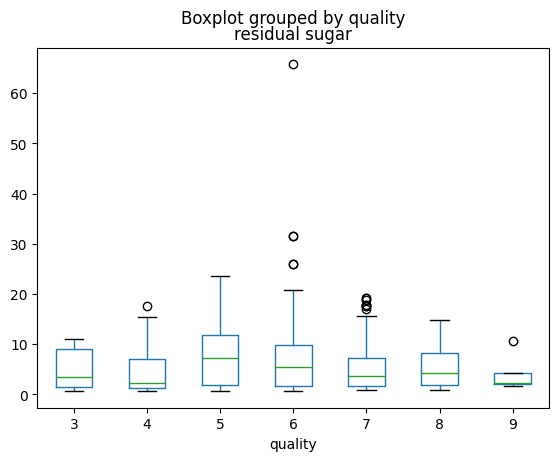

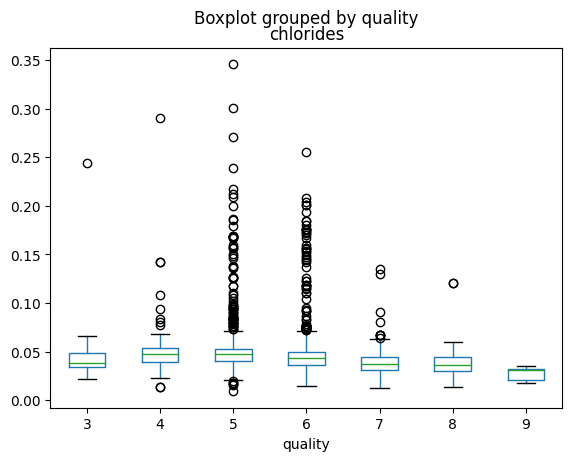

...

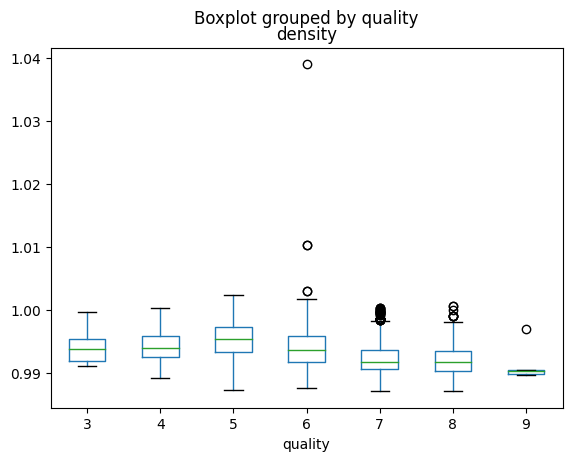

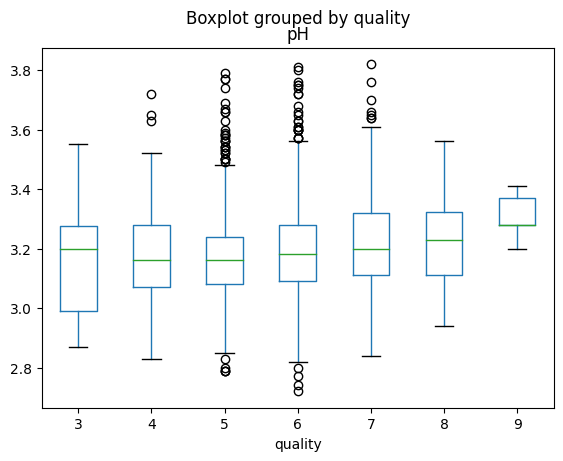

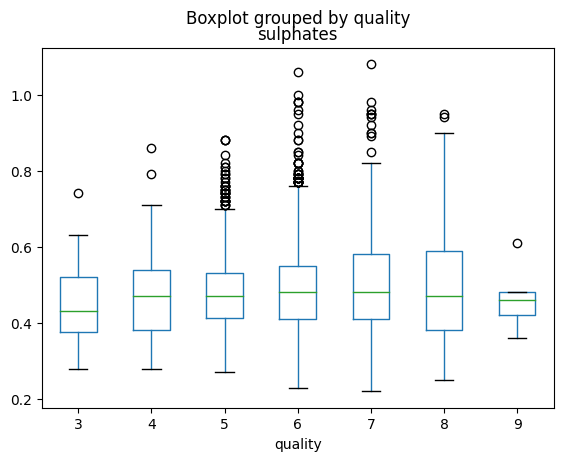

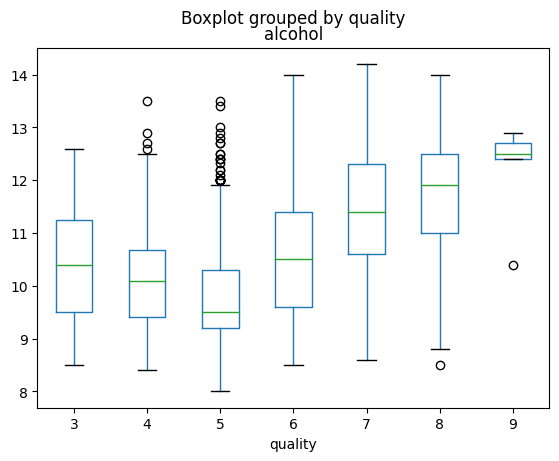

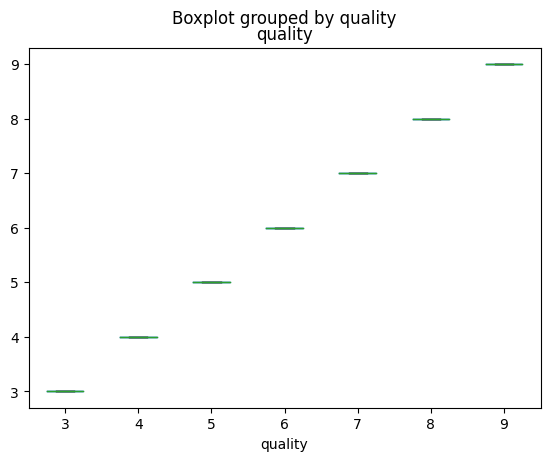

In [22]:
# Plot side-by-side boxplot for each variable to find which ones are likely to help predict classes

for col in W_train.columns.values:
  W_train.boxplot(by='quality', column=col,grid=False)

spliting trainig data into input X and target y

,0,1,2,3,4,5,6,7,8,9,10
0,0.515119,-1.076233,0.227731,0.340419,-0.813688,0.534065,-0.641932,-0.447041,-0.328261,-0.702445,1.540371
1,-0.669188,-0.288777,0.895832,1.002071,-0.217212,0.773947,1.355106,0.903370,-0.061886,0.266074,-0.821712
2,-1.498203,0.400248,-0.022807,0.184737,-0.400743,-0.605377,-1.022320,-0.460280,0.404271,0.001933,0.481506
3,0.041396,-0.879369,0.144218,-0.924503,-0.446626,-0.125612,-0.879675,-0.304718,0.137896,0.442168,0.237153
4,0.988842,0.203384,-0.607396,2.432407,0.333383,0.054300,0.855846,1.883079,0.071302,0.089980,-0.088652
...,...,...,...,...,...,...,...,...,...,...,...
3913,-0.787619,-0.682505,1.563933,0.009594,0.058085,-0.425465,-0.356641,0.036194,0.204490,0.001933,-0.495907
3914,0.159827,-1.371529,-0.106320,0.496102,-0.308977,1.133771,0.071295,0.506190,0.204490,-0.526350,-0.903163
3915,0.870412,-0.091913,1.563933,-0.632598,-0.125446,-0.425465,0.332812,-0.920346,-1.127387,0.354121,0.725860
3916,-0.669188,-0.387209,-0.356858,1.410739,-0.492509,1.073800,-0.095124,0.529359,-0.128480,-0.966586,0.074251


0     2.566151e-16
1    -5.368062e-16
2    -3.300632e-16
3     7.344814e-17
4    -3.228091e-16
5    -9.883762e-17
6     6.982107e-17
7    -1.228171e-14
8     1.735552e-15
9    -2.003955e-16
10    5.485941e-17
dtype: float64


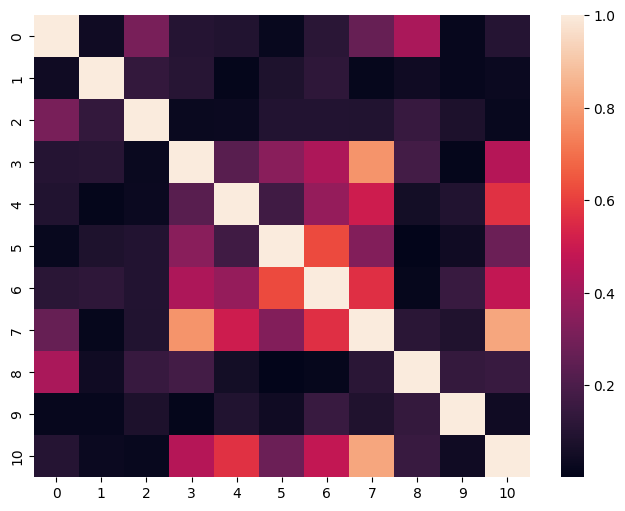

In [23]:
# Normalize data (shift and scale so that columns are zero mean and unit variance)
from sklearn import preprocessing

scaler = preprocessing.StandardScaler() # For data normalization

scaler.fit(W_train.drop(columns=['quality'])) # Compute mean and std
W_train_X = pd.DataFrame(scaler.transform(W_train.drop(columns=['quality']))) # Use mean and std
# W_train_Y = pd.DataFrame(W_train['quality'])
W_train_Y = W_train['quality']
display(W_train_X)
print(W_train_X.mean())

corrMatrix = W_train_X.corr(method='spearman') # Check correlation again
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(abs(corrMatrix), annot=False)
plt.show()

spliting test data into input X and target y

In [24]:
# Normalize test data using the same scaler that was fitted on training.

W_test_X = pd.DataFrame(scaler.transform(W_test.drop(columns=['quality'])))
# W_test_Y = pd.DataFrame(W_test['quality'])
W_test_Y = W_test['quality']


display(W_test_X)
print(W_test_X.mean())


,0,1,2,3,4,5,6,7,8,9,10
0,-1.024480,0.104951,0.645294,0.846388,0.103968,1.193741,0.261490,-0.122677,-0.661230,0.882404,0.372905
1,-1.735065,2.467321,-1.442522,-0.729900,-0.446626,-0.065642,-0.237770,-1.823930,0.071302,0.354121,2.191980
2,0.278258,-0.288777,0.478269,-0.846662,-0.446626,-0.305524,-0.332867,-1.082528,0.604053,-0.526350,1.377469
3,0.515119,0.006519,0.144218,-0.943963,0.379265,-0.245554,0.237715,-0.758165,-0.061886,-0.174162,0.155702
4,-0.432327,0.400248,0.060705,-0.146089,-0.079563,-0.485436,-1.117418,-0.738306,0.604053,0.970452,1.214566
...,...,...,...,...,...,...,...,...,...,...,...
975,-0.077034,-0.682505,0.728807,-1.021805,-0.033680,-0.665348,-0.285318,-0.572814,-0.661230,3.347725,0.318604
976,0.515119,-0.190345,1.313395,-0.282312,-0.813688,-0.185583,-0.737029,-0.155776,0.337677,0.442168,0.237153
977,-1.142911,-0.190345,-1.024959,1.177214,-0.538391,0.054300,0.332812,1.035763,0.604053,-0.526350,-0.821712
978,0.751981,0.104951,-0.189832,0.486372,0.425148,-0.905230,0.309038,0.903370,-0.727824,0.442168,-0.984614


0    -0.060720
1    -0.053946
2     0.060961
3    -0.057664
4     0.008785
5     0.063999
6     0.042718
7    -0.071578
8    -0.034161
9     0.002921
10    0.022091
dtype: float64


#Training Random Forest Classifier model for Red wine

In [25]:

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, f1_score

# Define the scorer for multiple classes
#scoring = make_scorer(f1_score, average='weighted')  # You can choose 'micro', 'macro', or 'weighted'
scoring = 'accuracy'

rfc = RandomForestClassifier() # Now, we will try random forest
hyperparameters = {'max_depth':[5,10,15,20,None],'n_estimators':[10,30,70,100]}
clf = GridSearchCV(rfc, param_grid=hyperparameters,scoring=scoring)
clf.fit(np.array(R_train_X), np.squeeze(R_train_Y))
print('Best parameters:')
print(clf.best_params_)
print('Best scoring'  + ": " + str(clf.best_score_))

print('Test classification report:')
R_y_true, R_y_pred = np.squeeze(R_test_Y), clf.predict(np.array(R_test_X))

from sklearn.metrics import classification_report

# Define classification report with zero_division parameter
print(classification_report(R_y_true, R_y_pred, zero_division=0))  # or zero_division="warn"




Best parameters:
{'max_depth': 15, 'n_estimators': 100}
Best scoring: 0.6904319852941176
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.70      0.77      0.74       130
           6       0.64      0.70      0.67       132
           7       0.62      0.50      0.55        42
           8       0.00      0.00      0.00         5

    accuracy                           0.67       320
   macro avg       0.33      0.33      0.33       320
weighted avg       0.63      0.67      0.65       320



In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report
from sklearn.utils import shuffle
from imblearn.over_sampling import RandomOverSampler
import numpy as np

# Data augmentation using random oversampling
ros = RandomOverSampler()
train_X_resampled, train_Y_resampled = ros.fit_resample(R_train_X, R_train_Y)

# Shuffle the data
train_X_resampled, train_Y_resampled = shuffle(train_X_resampled, train_Y_resampled)

rfc = RandomForestClassifier()  # Initialize the Random Forest Classifier
hyperparameters = {'max_depth': [2, 5, 10, 20], 'n_estimators': [10, 30, 100]}
scoring = 'accuracy'  # Adjust the scoring metric for multi-class classification
clf = GridSearchCV(rfc, param_grid=hyperparameters, scoring=scoring)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(clf, np.array(train_X_resampled), np.squeeze(train_Y_resampled), cv=5)
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Fit the model
clf.fit(np.array(train_X_resampled), np.squeeze(train_Y_resampled))

print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(R_test_Y), clf.predict(np.array(R_test_X))
print(classification_report(y_true, y_pred))


Cross-Validation Accuracy Scores: [0.90332326 0.88804841 0.90620272 0.90771558 0.90771558]
Mean CV Accuracy: 0.9026011124772044
Best parameters:
{'max_depth': 20, 'n_estimators': 100}
Best accuracy: 0.9071387762750753
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.75      0.75      0.75       130
           6       0.63      0.68      0.66       132
           7       0.57      0.60      0.58        42
           8       0.00      0.00      0.00         5

    accuracy                           0.66       320
   macro avg       0.32      0.34      0.33       320
weighted avg       0.64      0.66      0.65       320



saving the trained model to use in Q4

In [27]:
import joblib
joblib.dump(clf, "Red_wine_random_forest_model.pkl")

['Red_wine_random_forest_model.pkl']

red wine model on white wine data

In [28]:
print('Test classification report for red wine model on white wine data:')
y_true, y_pred = np.squeeze(W_test_Y), clf.predict(np.array(W_test_X))
print(classification_report(y_true, y_pred,zero_division=0))


Test classification report for red wine model on white wine data:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       1.00      0.12      0.21        25
           5       0.44      0.73      0.55       291
           6       0.47      0.49      0.48       432
           7       0.53      0.10      0.17       192
           8       0.00      0.00      0.00        35

    accuracy                           0.46       980
   macro avg       0.40      0.24      0.24       980
weighted avg       0.46      0.46      0.41       980



##Training Random Forest Classifier model for White wine

In [29]:

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, f1_score

# f1_score, average='weighted' # You can choose 'micro', 'macro', or 'weighted'
scoring = 'accuracy'

rfc = RandomForestClassifier() # Now, we will try random forest
hyperparameters = {'max_depth':[5,10,15,20,None],'n_estimators':[10,30,70,100]}
clf = GridSearchCV(rfc, param_grid=hyperparameters,scoring=scoring)
clf.fit(np.array(W_train_X), np.squeeze(W_train_Y))
print('Best parameters:')
print(clf.best_params_)
print('Best scoring'  + ": " + str(clf.best_score_))

print('Test classification report:')
W_y_true, W_y_pred = np.squeeze(W_test_Y), clf.predict(np.array(W_test_X))

from sklearn.metrics import classification_report

# Define classification report with zero_division parameter
print(classification_report(W_y_true, W_y_pred, zero_division=0))  # or zero_division="warn"




Best parameters:
{'max_depth': None, 'n_estimators': 70}
Best scoring: 0.6610456251466104
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.64      0.28      0.39        25
           5       0.72      0.68      0.70       291
           6       0.67      0.81      0.73       432
           7       0.77      0.61      0.68       192
           8       0.88      0.40      0.55        35

    accuracy                           0.70       980
   macro avg       0.61      0.46      0.51       980
weighted avg       0.70      0.70      0.69       980



In [30]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report
from sklearn.utils import shuffle
from imblearn.over_sampling import RandomOverSampler
import numpy as np

# Data augmentation using random oversampling
ros = RandomOverSampler()
train_X_resampled, train_Y_resampled = ros.fit_resample(W_train_X, W_train_Y)

# Shuffle the data
train_X_resampled, train_Y_resampled = shuffle(train_X_resampled, train_Y_resampled)

rfc = RandomForestClassifier()  # Initialize the Random Forest Classifier
hyperparameters = {'max_depth': [2, 5, 10, 20], 'n_estimators': [10, 30, 100]}
scoring = 'accuracy'  # Adjust the scoring metric for multi-class classification
clf = GridSearchCV(rfc, param_grid=hyperparameters, scoring=scoring)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(clf, np.array(train_X_resampled), np.squeeze(train_Y_resampled), cv=5)
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Fit the model
clf.fit(np.array(train_X_resampled), np.squeeze(train_Y_resampled))

print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(W_test_Y), clf.predict(np.array(W_test_X))
print(classification_report(y_true, y_pred, zero_division=1))


Cross-Validation Accuracy Scores: [0.92155277 0.92761828 0.92354369 0.927589   0.93527508]
Mean CV Accuracy: 0.92711576286025
Best parameters:
{'max_depth': 20, 'n_estimators': 100}
Best accuracy: 0.9265492235234383
Test classification report:
              precision    recall  f1-score   support

           3       0.50      0.20      0.29         5
           4       0.50      0.36      0.42        25
           5       0.70      0.70      0.70       291
           6       0.69      0.73      0.71       432
           7       0.69      0.68      0.68       192
           8       0.80      0.46      0.58        35
           9       0.00      1.00      0.00         0

    accuracy                           0.69       980
   macro avg       0.55      0.59      0.48       980
weighted avg       0.69      0.69      0.69       980



white wine model on red wine data:

In [31]:
print('Test classification report for white wine model on red wine data:')
y_true, y_pred = np.squeeze(R_test_Y), clf.predict(np.array(R_test_X))
print(classification_report(y_true, y_pred, zero_division=1))


Test classification report for white wine model on red wine data:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       1.00      0.00      0.00        10
           5       0.61      0.49      0.54       130
           6       0.46      0.58      0.52       132
           7       0.23      0.24      0.24        42
           8       0.00      0.00      0.00         5

    accuracy                           0.47       320
   macro avg       0.38      0.22      0.22       320
weighted avg       0.50      0.47      0.46       320



For Red wine feature importance

Feature: 0, Score: 0.07669
Feature: 1, Score: 0.10144
Feature: 2, Score: 0.07370
Feature: 3, Score: 0.07366
Feature: 4, Score: 0.08108
Feature: 5, Score: 0.06489
Feature: 6, Score: 0.10191
Feature: 7, Score: 0.08983
Feature: 8, Score: 0.07565
Feature: 9, Score: 0.11488
Feature: 10, Score: 0.14626


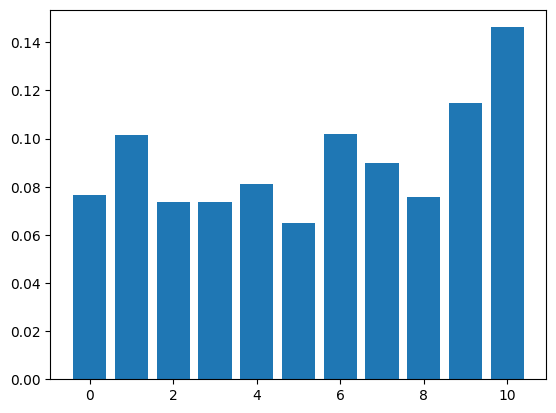

In [32]:
# random forest for feature importance on a classification problem

from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot

model = RandomForestClassifier()
# fit the model
model.fit(R_train_X, R_train_Y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

Refference :https://www.analyticsvidhya.com/blog/2020/10/feature-selection-techniques-in-machine-learning/

For White wine feature importance

Feature: 0, Score: 0.07409
Feature: 1, Score: 0.10132
Feature: 2, Score: 0.07926
Feature: 3, Score: 0.08891
Feature: 4, Score: 0.08652
Feature: 5, Score: 0.09619
Feature: 6, Score: 0.09353
Feature: 7, Score: 0.10384
Feature: 8, Score: 0.08546
Feature: 9, Score: 0.07806
Feature: 10, Score: 0.11283


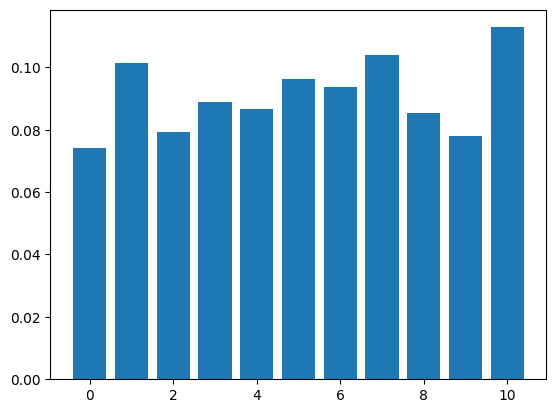

In [33]:
# random forest for feature importance on a classification problem
#from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
# define dataset

# define the model
model = RandomForestClassifier()
# fit the model
model.fit(W_train_X, W_train_Y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

##Training Support vector regression with RBF kernel model for Red Wine  

In [34]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here
clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring)

clf.fit(np.array(R_train_X), np.squeeze(R_train_Y))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(R_test_Y), clf.predict(np.array(R_test_X))
print(classification_report(y_true, y_pred, zero_division=1))


Training SVC using GridSearchCV
Best parameters:
{'C': 10, 'degree': 3}
Best accuracy: 0.6396017156862746
Test classification report:
              precision    recall  f1-score   support

           3       1.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.67      0.75      0.71       130
           6       0.59      0.61      0.60       132
           7       0.55      0.40      0.47        42
           8       0.00      0.00      0.00         5

    accuracy                           0.61       320
   macro avg       0.47      0.29      0.30       320
weighted avg       0.59      0.61      0.60       320



In [35]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

# Feature Scaling
scaler = StandardScaler()
R_train_X_scaled = scaler.fit_transform(R_train_X)
R_test_X_scaled = scaler.transform(R_test_X)

# Data Augmentation using Random Oversampling
ros = RandomOverSampler()
R_train_X_resampled, R_train_Y_resampled = ros.fit_resample(R_train_X_scaled, R_train_Y)

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here

# Use StratifiedKFold for cross-validation to ensure class balance in each fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring, cv=cv)

clf.fit(np.array(R_train_X_resampled), np.squeeze(R_train_Y_resampled))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(R_test_Y), clf.predict(R_test_X_scaled)
print(classification_report(y_true, y_pred))


Training SVC using GridSearchCV
Best parameters:
{'C': 10, 'degree': 3}
Best accuracy: 0.844829997577597
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.19      0.40      0.26        10
           5       0.66      0.65      0.66       130
           6       0.60      0.55      0.57       132
           7       0.53      0.55      0.54        42
           8       0.20      0.20      0.20         5

    accuracy                           0.58       320
   macro avg       0.36      0.39      0.37       320
weighted avg       0.60      0.58      0.59       320



red wine model on white wine data:

In [36]:
print('Test classification report for red wine model on white wine data:')
y_true, y_pred = np.squeeze(W_test_Y), clf.predict(np.array(W_test_X))
print(classification_report(y_true, y_pred,zero_division=0))

Test classification report for red wine model on white wine data:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.07      0.28      0.11        25
           5       0.40      0.59      0.48       291
           6       0.50      0.41      0.45       432
           7       0.42      0.11      0.18       192
           8       0.09      0.09      0.09        35

    accuracy                           0.39       980
   macro avg       0.25      0.25      0.22       980
weighted avg       0.43      0.39      0.38       980



feature importance for red wine

Feature: 0, Score: 0.01376
Feature: 1, Score: 0.04261
Feature: 2, Score: 0.01845
Feature: 3, Score: 0.02408
Feature: 4, Score: 0.02228
Feature: 5, Score: 0.02158
Feature: 6, Score: 0.03987
Feature: 7, Score: 0.02729
Feature: 8, Score: 0.01962
Feature: 9, Score: 0.06310
Feature: 10, Score: 0.12197


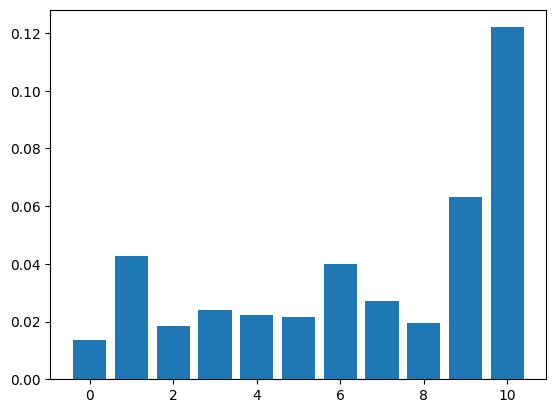

In [37]:
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance
from matplotlib import pyplot

# Define the model
model = SVC(kernel='rbf')  # We specify the kernel here

# Fit the model
model.fit(R_train_X, R_train_Y)

# Perform permutation feature importance
result = permutation_importance(model, R_train_X, R_train_Y, n_repeats=10, random_state=42)

# Get feature importances
importance = result.importances_mean

# Summarize feature importance
for i, v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i, v))

# Plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()


##Training Support vector regression with RBF kernel model for White Wine  

In [38]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here
clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring)

clf.fit(np.array(W_train_X), np.squeeze(W_train_Y))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(W_test_Y), clf.predict(np.array(W_test_X))
print(classification_report(y_true, y_pred, zero_division=1))


Training SVC using GridSearchCV
Best parameters:
{'C': 10, 'degree': 3}
Best accuracy: 0.5780977141814581
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.35      0.24      0.29        25
           5       0.63      0.58      0.61       291
           6       0.57      0.75      0.65       432
           7       0.60      0.36      0.45       192
           8       0.45      0.14      0.22        35

    accuracy                           0.59       980
   macro avg       0.44      0.35      0.37       980
weighted avg       0.58      0.59      0.57       980



In [39]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

# Feature Scaling
scaler = StandardScaler()
W_train_X_scaled = scaler.fit_transform(W_train_X)
W_test_X_scaled = scaler.transform(W_test_X)

# Data Augmentation using Random Oversampling
ros = RandomOverSampler()
W_train_X_resampled, W_train_Y_resampled = ros.fit_resample(W_train_X_scaled, W_train_Y)

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here

# Use StratifiedKFold for cross-validation to ensure class balance in each fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring, cv=cv)

clf.fit(np.array(W_train_X_resampled), np.squeeze(W_train_Y_resampled))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(W_test_Y), clf.predict(W_test_X_scaled)
print(classification_report(y_true, y_pred,zero_division=0))


Training SVC using GridSearchCV
Best parameters:
{'C': 10, 'degree': 3}
Best accuracy: 0.8156445599529938
Test classification report:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.17      0.44      0.25        25
           5       0.59      0.63      0.61       291
           6       0.64      0.45      0.53       432
           7       0.46      0.58      0.51       192
           8       0.32      0.54      0.40        35
           9       0.00      0.00      0.00         0

    accuracy                           0.53       980
   macro avg       0.31      0.38      0.33       980
weighted avg       0.56      0.53      0.53       980



white wine model on red wine data:

In [40]:
print('Test classification report for white wine model on red wine data:')
y_true, y_pred = np.squeeze(R_test_Y), clf.predict(np.array(R_test_X))
print(classification_report(y_true, y_pred,zero_division=0))


Test classification report for white wine model on red wine data:
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.04      0.10      0.06        10
           5       0.57      0.48      0.53       130
           6       0.46      0.33      0.38       132
           7       0.20      0.31      0.24        42
           8       0.04      0.20      0.07         5

    accuracy                           0.38       320
   macro avg       0.22      0.24      0.21       320
weighted avg       0.45      0.38      0.40       320



feature importance for White wine

Feature: 0, Score: 0.03063
Feature: 1, Score: 0.06636
Feature: 2, Score: 0.02555
Feature: 3, Score: 0.03058
Feature: 4, Score: 0.02491
Feature: 5, Score: 0.03142
Feature: 6, Score: 0.03831
Feature: 7, Score: 0.02820
Feature: 8, Score: 0.03502
Feature: 9, Score: 0.02399
Feature: 10, Score: 0.08553


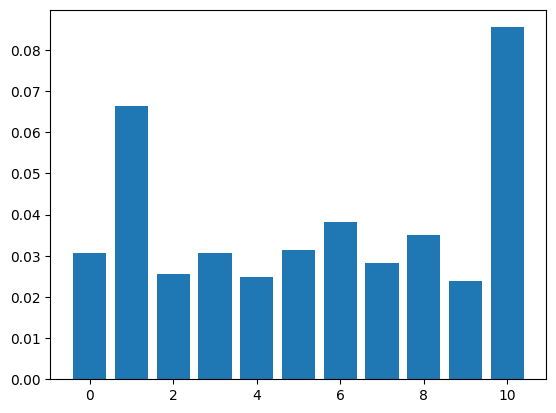

In [41]:
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance
from matplotlib import pyplot

# Define the model
model = SVC(kernel='rbf')  # We specify the kernel here

# Fit the model
model.fit(W_train_X, W_train_Y)

# Perform permutation feature importance
result = permutation_importance(model, W_train_X, W_train_Y, n_repeats=10, random_state=42)

# Get feature importances
importance = result.importances_mean

# Summarize feature importance
for i, v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i, v))

# Plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()


#Considering as a regeression problem

For red wine

Random Forest RMSE: 0.5583472764403989
Support Vector Regression RMSE: 0.5922966232018798
Neural Network Regression RMSE: 0.5745990369794295


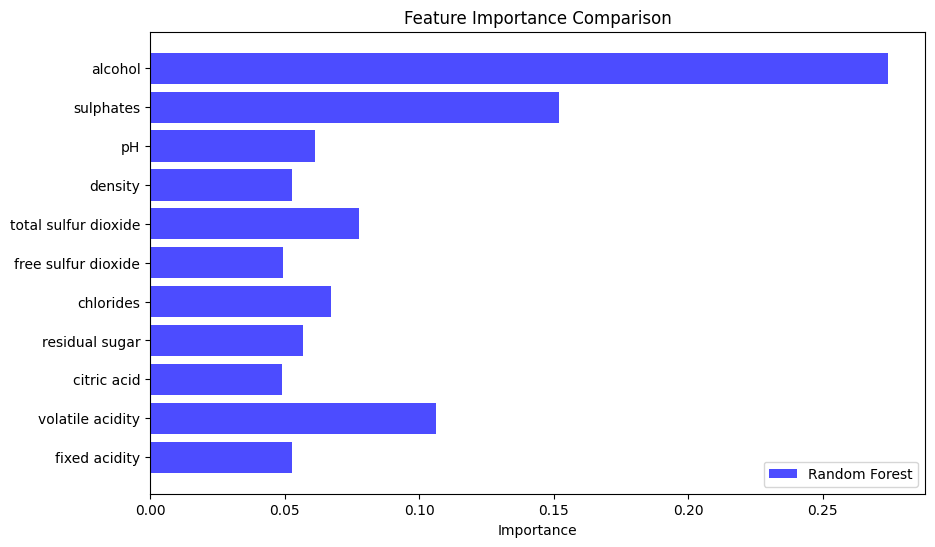

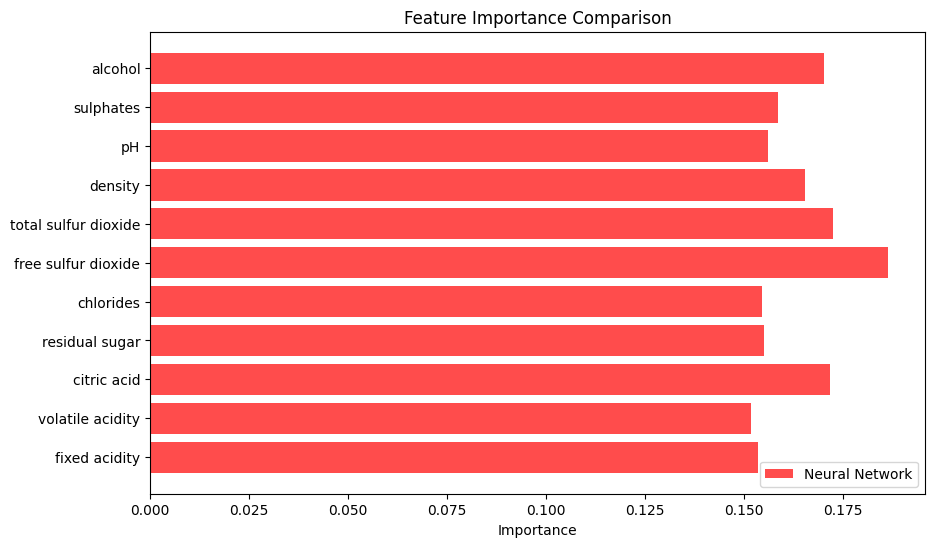

RMSE for red wine model on white wine data: 0.9472615439509018


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


In [42]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

R_X = red_wine_data.drop(columns=['quality'])
R_y = red_wine_data['quality']

# Random Forest Regression
rf_regressor = RandomForestRegressor()
rf_param_grid = {'n_estimators': [50, 100, 150], 'max_depth': [10, 20, 30]}
rf_grid_search = GridSearchCV(rf_regressor, param_grid=rf_param_grid, scoring='neg_mean_squared_error', cv=5)
rf_grid_search.fit(R_train_X, R_train_Y)
rf_best_model = rf_grid_search.best_estimator_
rf_predictions = rf_best_model.predict(R_test_X)
rf_rmse = np.sqrt(mean_squared_error(R_test_Y, rf_predictions))


# Support Vector Regression
svr_regressor = SVR(kernel='rbf')
svr_param_grid = {'C': [0.1, 1, 10], 'gamma': [0.1, 0.01, 0.001]}
svr_grid_search = GridSearchCV(svr_regressor, param_grid=svr_param_grid, scoring='neg_mean_squared_error', cv=5)
svr_grid_search.fit(R_train_X, R_train_Y)
svr_best_model = svr_grid_search.best_estimator_
svr_predictions = svr_best_model.predict(R_test_X)
svr_rmse = np.sqrt(mean_squared_error(R_test_Y, svr_predictions))


# Neural Network Regression
nn_regressor = MLPRegressor(hidden_layer_sizes=(100,), activation='relu', solver='adam', max_iter=1000)
nn_param_grid = {'alpha': [0.0001, 0.001, 0.01]}
nn_grid_search = GridSearchCV(nn_regressor, param_grid=nn_param_grid, scoring='neg_mean_squared_error', cv=5)
nn_grid_search.fit(R_train_X, R_train_Y)
nn_best_model = nn_grid_search.best_estimator_
nn_predictions = nn_best_model.predict(R_test_X)
nn_rmse = np.sqrt(mean_squared_error(R_test_Y, nn_predictions))

print("Random Forest RMSE:", rf_rmse)
print("Support Vector Regression RMSE:", svr_rmse)
print("Neural Network Regression RMSE:", nn_rmse)

# Variable Importance
feature_importances_rf = rf_best_model.feature_importances_
# Flatten the neural network feature importances array
feature_importances_nn = np.mean(np.abs(nn_best_model.coefs_[0]), axis=1)

R_X = red_wine_data.drop(columns=['quality'])
R_y = red_wine_data['quality']

plt.figure(figsize=(10, 6))
plt.barh(R_X.columns, feature_importances_rf, color='b', alpha=0.7, label='Random Forest')
#plt.barh(X.columns, feature_importances_nn, color='r', alpha=0.7, label='Neural Network')
plt.xlabel('Importance')
plt.title('Feature Importance Comparison')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
#plt.barh(X.columns, feature_importances_rf, color='b', alpha=0.7, label='Random Forest')
plt.barh(R_X.columns, feature_importances_nn, color='r', alpha=0.7, label='Neural Network')
plt.xlabel('Importance')
plt.title('Feature Importance Comparison')
plt.legend()
plt.show()
# Out-of-distribution prediction
#red_test_X = red_wine_data.drop(columns=['quality'])
white_test_X = white_wine_data.drop(columns=['quality'])

#red_rf_predictions = rf_best_model.predict(red_test_X)
white_rf_predictions = rf_best_model.predict(white_test_X)

print("RMSE for red wine model on white wine data:", np.sqrt(mean_squared_error(white_wine_data['quality'], white_rf_predictions)))
# print("RMSE for white wine model on red wine data:", np.sqrt(mean_squared_error(red_wine_data['quality'], red_rf_predictions)))


#For white wine

Random Forest RMSE: 0.5872995695140811
Support Vector Regression RMSE: 0.6840372897070698
Neural Network Regression RMSE: 0.6876650493359419


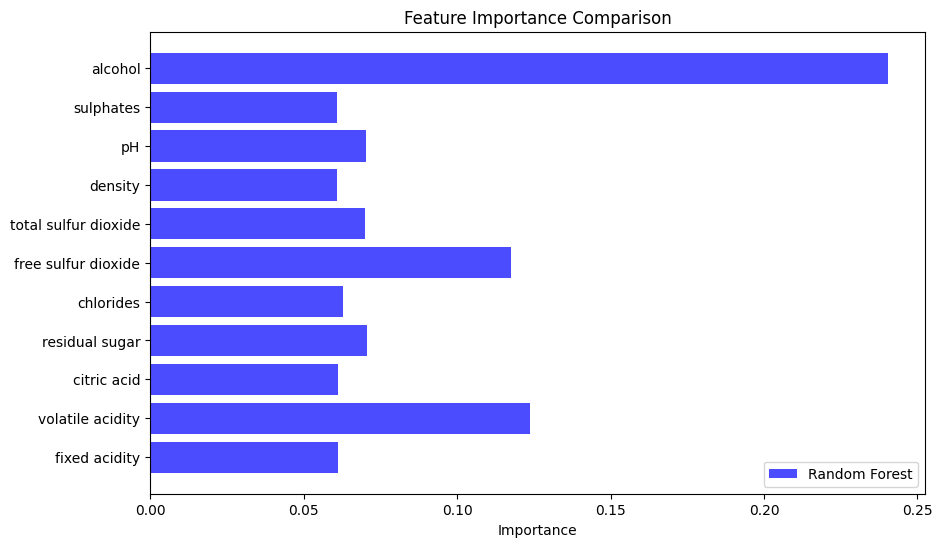

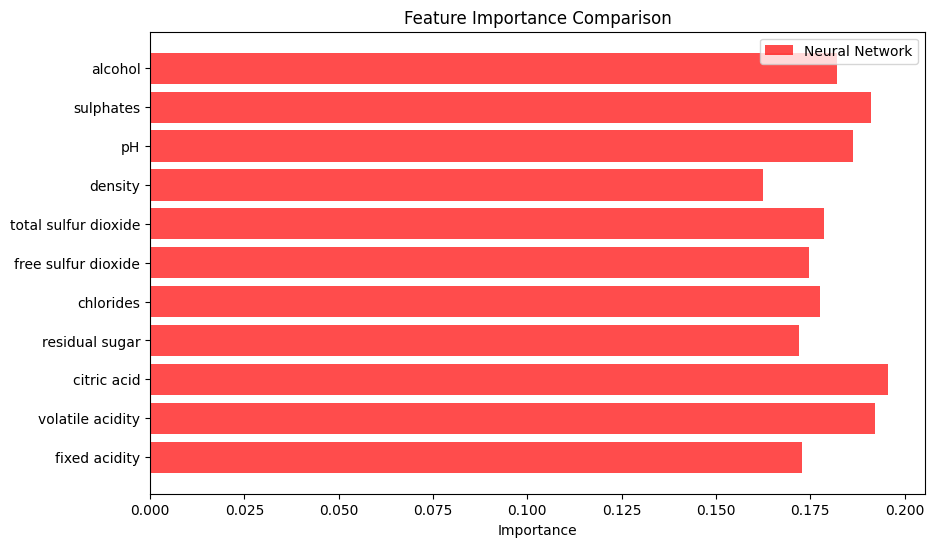

RMSE for red wine model on white wine data: 0.9472615439509018


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


In [43]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

W_X = white_wine_data.drop(columns=['quality'])
W_y = white_wine_data['quality']

# Random Forest Regression
rf_regressor = RandomForestRegressor()
rf_param_grid = {'n_estimators': [50, 100, 150], 'max_depth': [10, 20, 30]}
rf_grid_search = GridSearchCV(rf_regressor, param_grid=rf_param_grid, scoring='neg_mean_squared_error', cv=5)
rf_grid_search.fit(W_train_X, W_train_Y)
rf_best_model = rf_grid_search.best_estimator_
rf_predictions = rf_best_model.predict(W_test_X)
rf_rmse = np.sqrt(mean_squared_error(W_test_Y, rf_predictions))

# Support Vector Regression
svr_regressor = SVR(kernel='rbf')
svr_param_grid = {'C': [0.1, 1, 10], 'gamma': [0.1, 0.01, 0.001]}
svr_grid_search = GridSearchCV(svr_regressor, param_grid=svr_param_grid, scoring='neg_mean_squared_error', cv=5)
svr_grid_search.fit(W_train_X, W_train_Y)
svr_best_model = svr_grid_search.best_estimator_
svr_predictions = svr_best_model.predict(W_test_X)
svr_rmse = np.sqrt(mean_squared_error(W_test_Y, svr_predictions))

# Neural Network Regression
nn_regressor = MLPRegressor(hidden_layer_sizes=(100,), activation='relu', solver='adam', max_iter=1000)
nn_param_grid = {'alpha': [0.0001, 0.001, 0.01]}
nn_grid_search = GridSearchCV(nn_regressor, param_grid=nn_param_grid, scoring='neg_mean_squared_error', cv=5)
nn_grid_search.fit(W_train_X, W_train_Y)
nn_best_model = nn_grid_search.best_estimator_
nn_predictions = nn_best_model.predict(W_test_X)
nn_rmse = np.sqrt(mean_squared_error(W_test_Y, nn_predictions))

print("Random Forest RMSE:", rf_rmse)
print("Support Vector Regression RMSE:", svr_rmse)
print("Neural Network Regression RMSE:", nn_rmse)

# Variable Importance
feature_importances_rf = rf_best_model.feature_importances_
# Flatten the neural network feature importances array
feature_importances_nn = np.mean(np.abs(nn_best_model.coefs_[0]), axis=1)

plt.figure(figsize=(10, 6))
plt.barh(W_X.columns, feature_importances_rf, color='b', alpha=0.7, label='Random Forest')
#plt.barh(X.columns, feature_importances_nn, color='r', alpha=0.7, label='Neural Network')
plt.xlabel('Importance')
plt.title('Feature Importance Comparison')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
#plt.barh(X.columns, feature_importances_rf, color='b', alpha=0.7, label='Random Forest')
plt.barh(W_X.columns, feature_importances_nn, color='r', alpha=0.7, label='Neural Network')
plt.xlabel('Importance')
plt.title('Feature Importance Comparison')
plt.legend()
plt.show()
# Out-of-distribution prediction
red_test_X = red_wine_data.drop(columns=['quality'])
#white_test_X = white_wine_data.drop(columns=['quality'])

red_rf_predictions = rf_best_model.predict(red_test_X)
#white_rf_predictions = rf_best_model.predict(white_test_X)

print("RMSE for red wine model on white wine data:", np.sqrt(mean_squared_error(white_wine_data['quality'], white_rf_predictions)))
#print("RMSE for white wine model on red wine data:", np.sqrt(mean_squared_error(red_wine_data['quality'], red_rf_predictions)))


Same variable have diferent importance for diferent models.

# **Q2**

importing data from link and
removing unnecessary columns

In [44]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFECV
from sklearn.metrics import accuracy_score

# Load the dataset
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00342/Data_Cortex_Nuclear.xls"
m = pd.read_excel(url)
mice_data = m.drop(columns=['MouseID', 'Treatment','Behavior','Genotype'])
# Explore and visualize the data
display(mice_data)
print(mice_data.head())
print(mice_data.info())


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,c-CS-m
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,c-CS-m
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,c-CS-m
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,c-CS-m
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.129954,NaN,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,c-CS-m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,0.190483,NaN,0.115806,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,t-SC-s
1076,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,0.190463,NaN,0.113614,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,t-SC-s
1077,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,0.216682,NaN,0.118948,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,t-SC-s
1078,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,0.222263,NaN,0.125295,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,t-SC-s


   DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N   pBRAF_N  \
0  0.503644  0.747193  0.430175  2.816329  5.990152  0.218830  0.177565   
1  0.514617  0.689064  0.411770  2.789514  5.685038  0.211636  0.172817   
2  0.509183  0.730247  0.418309  2.687201  5.622059  0.209011  0.175722   
3  0.442107  0.617076  0.358626  2.466947  4.979503  0.222886  0.176463   
4  0.434940  0.617430  0.358802  2.365785  4.718679  0.213106  0.173627   

   pCAMKII_N   pCREB_N    pELK_N  ...     BAD_N  BCL2_N     pS6_N   pCFOS_N  \
0   2.373744  0.232224  1.750936  ...  0.122652     NaN  0.106305  0.108336   
1   2.292150  0.226972  1.596377  ...  0.116682     NaN  0.106592  0.104315   
2   2.283337  0.230247  1.561316  ...  0.118508     NaN  0.108303  0.106219   
3   2.152301  0.207004  1.595086  ...  0.132781     NaN  0.103184  0.111262   
4   2.134014  0.192158  1.504230  ...  0.129954     NaN  0.104784  0.110694   

      SYP_N  H3AcK18_N    EGR1_N  H3MeK4_N    CaNA_N   class  
0  0.427099

changing names to integer

In [45]:
import pandas as pd

df = pd.DataFrame(mice_data)


replace_dict = { 'c-CS-m': 1, 'c-CS-s': 2,'c-SC-m':3, 'c-SC-s':4, 't-CS-m':5, 't-CS-s':6, 't-SC-m':7, 't-SC-s':8 }
mice_data = df.replace(replace_dict)

display(mice_data)


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,1
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,1
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,1
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,1
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.129954,NaN,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,0.190483,NaN,0.115806,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,8
1076,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,0.190463,NaN,0.113614,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,8
1077,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,0.216682,NaN,0.118948,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,8
1078,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,0.222263,NaN,0.125295,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,8


handeling missing values and spliting data into two sets trainning and test

          DYRK1A_N      ITSN1_N       BDNF_N        NR1_N       NR2A_N  \
count  1077.000000  1077.000000  1077.000000  1077.000000  1077.000000   
mean      0.425810     0.617102     0.319088     2.297269     3.843934   
std       0.249362     0.251640     0.049383     0.347293     0.933100   
min       0.145327     0.245359     0.115181     1.330831     1.737540   
25%       0.288121     0.473361     0.287444     2.057411     3.155678   
50%       0.366378     0.565782     0.316564     2.296546     3.760855   
75%       0.487711     0.698032     0.348197     2.528481     4.440011   
max       2.516367     2.602662     0.497160     3.757641     8.482553   

            pAKT_N      pBRAF_N    pCAMKII_N      pCREB_N       pELK_N  ...  \
count  1077.000000  1077.000000  1077.000000  1077.000000  1077.000000  ...   
mean      0.233168     0.181846     3.537109     0.212574     1.428682  ...   
std       0.041634     0.027042     1.295169     0.032587     0.466904  ...   
min       0.06323

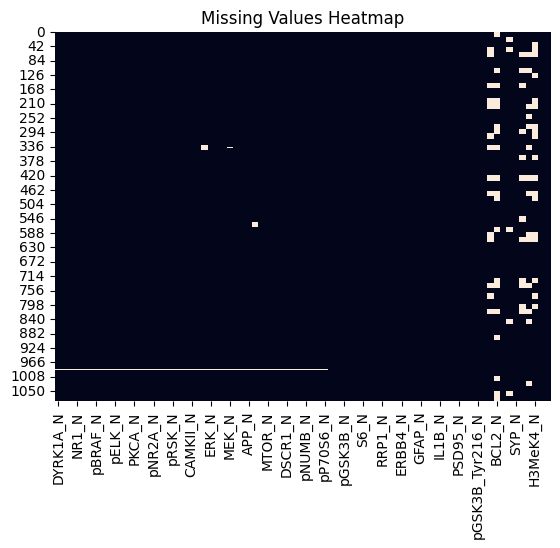

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split

# Load the dataset
df = mice_data

# Exploratory Data Analysis (EDA)
# Display summary statistics
print(df.describe())

# Visualize missing values
sns.heatmap(df.isnull(), cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

# Handle Missing Values
# Initialize IterativeImputer
imputer = IterativeImputer()

# Impute missing values
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Pre-processing
# Split the data into features (X) and target variable (y)
X = df_imputed.drop(columns=['class'])
y = df_imputed['class']

# Encode categorical variables, if any

# Scale numerical features, if needed

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further data exploration, visualization, and pre-processing as needed

# Train your machine learning model using the pre-processed data


data pre processing

In [47]:
for col in X_train.columns.values: # For each column
  list_vals = pd.unique(X_train[col])    # Create a list of unique values
  print(col + ' is of type ' + str(X_train[col].dtypes) + ', has ' + str(len(list_vals)) + ' unique values, and ' + str(np.sum(pd.isnull(X_train[col]))) + ' null entries')
  if len(list_vals) < 10: # If the column has less than 10 unique values then print them
    list_str = ''
    for n_value in range(0,len(list_vals)):
      list_str = list_str + str(list_vals[n_value]) + ', '
    print('  These are: '+list_str[0:len(list_str)-2])

DYRK1A_N is of type float64, has 864 unique values, and 0 null entries
ITSN1_N is of type float64, has 863 unique values, and 0 null entries
BDNF_N is of type float64, has 864 unique values, and 0 null entries
NR1_N is of type float64, has 864 unique values, and 0 null entries
NR2A_N is of type float64, has 864 unique values, and 0 null entries
pAKT_N is of type float64, has 863 unique values, and 0 null entries
pBRAF_N is of type float64, has 863 unique values, and 0 null entries
pCAMKII_N is of type float64, has 864 unique values, and 0 null entries
pCREB_N is of type float64, has 864 unique values, and 0 null entries
pELK_N is of type float64, has 864 unique values, and 0 null entries
pERK_N is of type float64, has 864 unique values, and 0 null entries
pJNK_N is of type float64, has 864 unique values, and 0 null entries
PKCA_N is of type float64, has 864 unique values, and 0 null entries
pMEK_N is of type float64, has 864 unique values, and 0 null entries
pNR1_N is of type float64, 

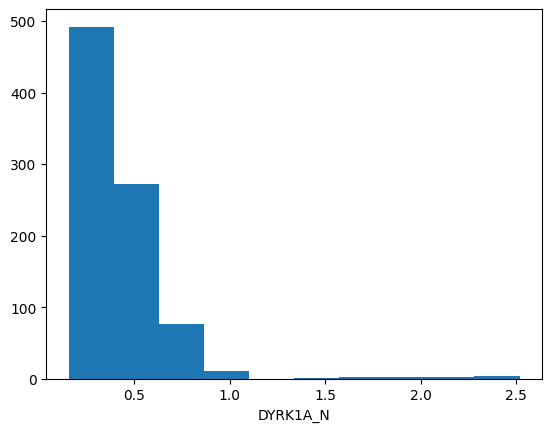

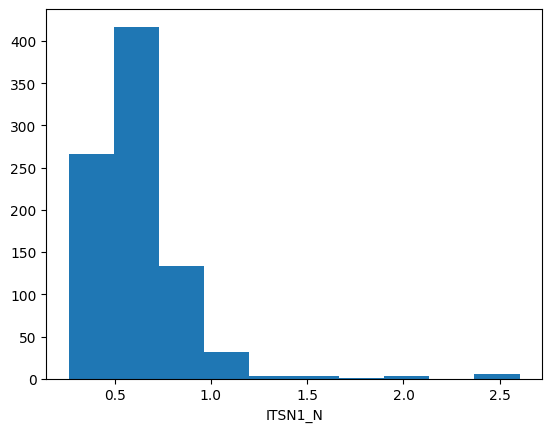

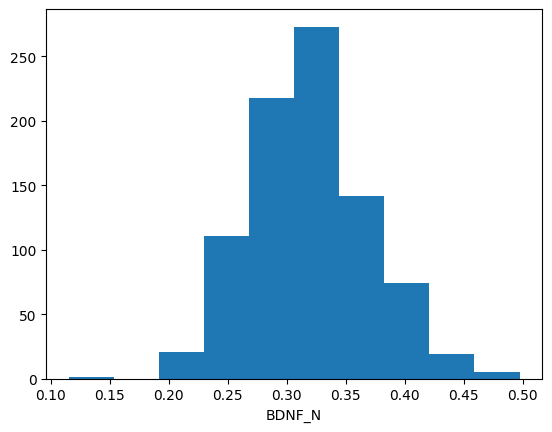

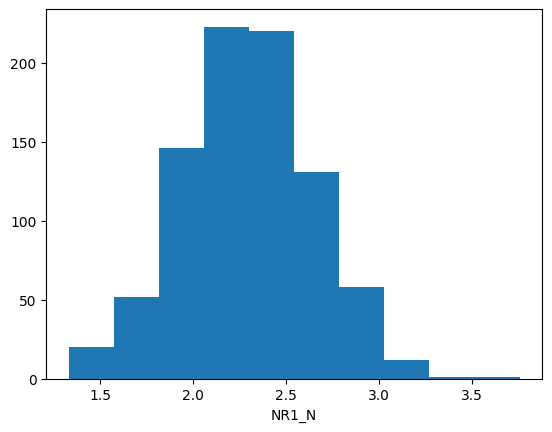

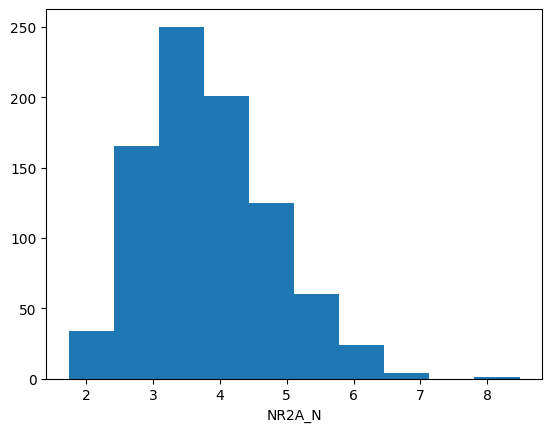

...

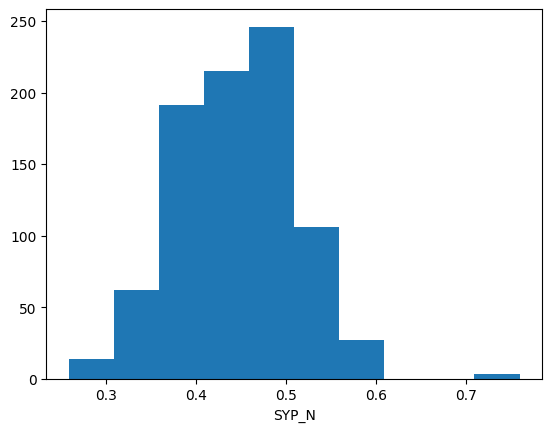

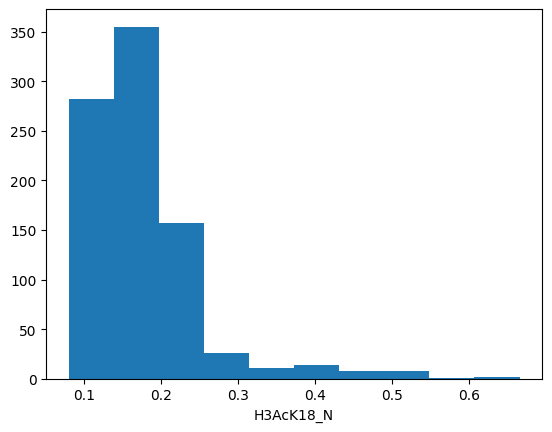

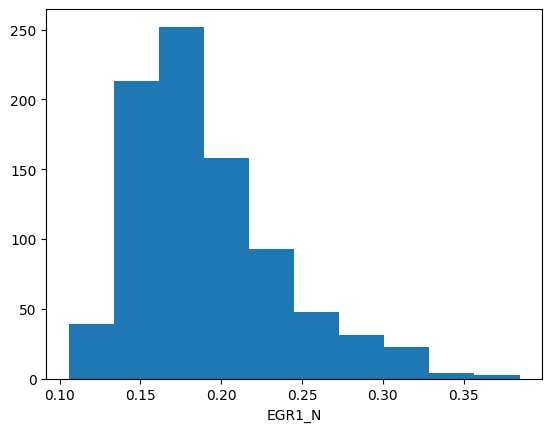

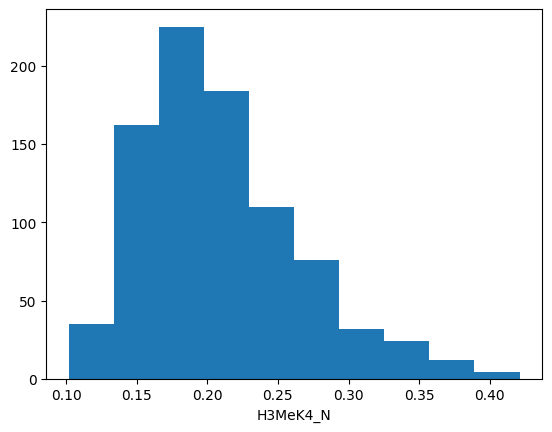

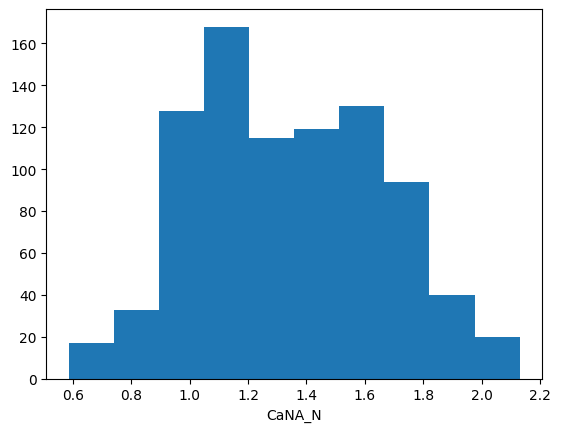

In [48]:
# Plot histograms for continuous variables

for col in X_train.columns.values:
  if (X_train[col].dtypes == 'int64') | (X_train[col].dtypes == 'float64'):
    plt.hist(X_train[col],10 if len(pd.unique(X_train[col]))>20 else len(pd.unique(X_train[col])))
    plt.xlabel(col)
    plt.show()

In [49]:

# We can also plot pair-wise scatter matrices (lazy coding)

# from pandas.plotting import scatter_matrix
# scatter_matrix(X_train, alpha=0.2, figsize=(26, 26), diagonal='kde') # kde is kernel density estimation

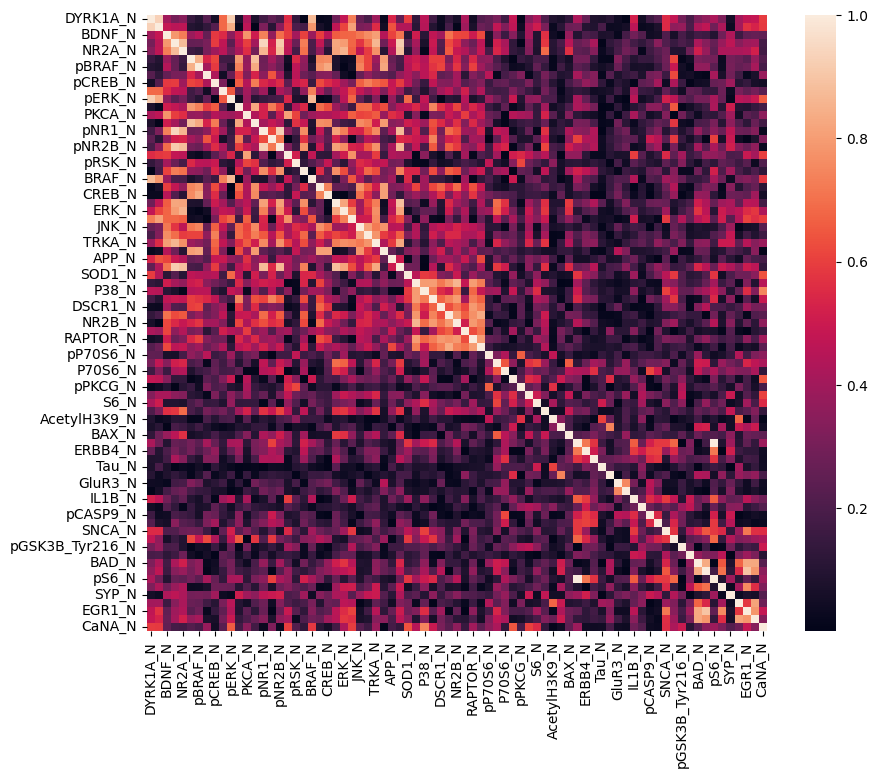

In [50]:

corrMatrix = X_train.corr(method='spearman') # Use spearman for non-linear
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(abs(corrMatrix), annot=False) # Show absolute value
plt.show()

exporting corelation data to file for better visulization

In [51]:
display(corrMatrix)
import pandas as pd


# Create a DataFrame
df = pd.DataFrame(corrMatrix)

# Export DataFrame to CSV
df.to_csv('corrMatrix.csv', index=False)


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
DYRK1A_N,1.000000,0.930113,0.401462,0.297949,0.338959,-0.146441,-0.094476,-0.224292,0.061590,0.685133,...,-0.190171,-0.319471,-0.359981,-0.423428,-0.319683,-0.057406,-0.405932,-0.470720,-0.480706,0.593747
ITSN1_N,0.930113,1.000000,0.481729,0.454137,0.466393,-0.095528,-0.079172,-0.130088,0.220834,0.685419,...,-0.197078,-0.429463,-0.470749,-0.287013,-0.428429,0.037454,-0.408050,-0.567168,-0.530895,0.586193
BDNF_N,0.401462,0.481729,1.000000,0.786163,0.727956,0.384191,0.442337,0.258929,0.584748,0.549266,...,-0.117865,-0.172454,-0.162656,0.097597,-0.286653,0.436541,-0.161974,-0.251275,-0.262502,0.252955
NR1_N,0.297949,0.454137,0.786163,1.000000,0.875597,0.259969,0.262315,0.307782,0.593715,0.471420,...,-0.164002,-0.422833,-0.337810,0.261846,-0.382583,0.467353,-0.342895,-0.391851,-0.404100,0.181344
NR2A_N,0.338959,0.466393,0.727956,0.875597,1.000000,0.163680,0.138315,0.306510,0.391834,0.454956,...,-0.278922,-0.512422,-0.378393,0.245522,-0.428405,0.422995,-0.418316,-0.433863,-0.519145,0.172523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SYP_N,-0.057406,0.037454,0.436541,0.467353,0.422995,0.295361,0.303345,0.289189,0.395069,0.039067,...,-0.000761,0.085217,0.118871,0.392794,-0.023998,1.000000,0.036104,0.077802,0.061273,0.219230
H3AcK18_N,-0.405932,-0.408050,-0.161974,-0.342895,-0.418316,0.269634,0.259464,0.169914,0.105477,-0.305424,...,0.306042,0.671997,0.541165,0.105793,0.402986,0.036104,1.000000,0.578242,0.812836,-0.278360
EGR1_N,-0.470720,-0.567168,-0.251275,-0.391851,-0.433863,0.231551,0.282605,0.021652,-0.141016,-0.247039,...,0.388060,0.828807,0.894873,0.248356,0.756546,0.077802,0.578242,1.000000,0.784481,-0.483610
H3MeK4_N,-0.480706,-0.530895,-0.262502,-0.404100,-0.519145,0.373174,0.411106,0.071887,0.064881,-0.296118,...,0.311440,0.826183,0.782002,0.134541,0.556284,0.061273,0.812836,0.784481,1.000000,-0.334280


In [52]:
import pandas as pd

# Assuming you have X_train and y_train already defined
X_train1 = X_train.copy()  # Create a deep copy of X_train

# Create DataFrame from X_train1
df = pd.DataFrame(X_train1)

# Add a new column 'Genotype' with the values of y_train
df['class'] = y_train

# Display the DataFrame
display(df)

# display(X_train1)
# display(X_train)


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,class
1009,0.402911,0.636168,0.357768,2.673090,4.682523,0.261555,0.187711,5.787495,0.244711,1.477833,...,0.160026,0.137784,0.116507,0.138411,0.509475,0.156640,0.178399,0.199654,1.172635,8.0
628,0.538779,0.627249,0.235624,1.572692,2.252728,0.189030,0.159245,1.570628,0.162194,1.377765,...,0.193259,0.142703,0.096988,0.161886,0.280925,0.158300,0.241484,0.203837,1.102546,5.0
644,0.490717,0.592462,0.213702,1.540847,2.053286,0.152432,0.134237,1.393799,0.142963,1.157817,...,0.161822,0.128550,0.100823,0.163502,0.300790,0.170223,0.187868,0.224332,1.236767,5.0
884,0.385382,0.590776,0.239984,1.739887,2.510455,0.168654,0.156732,1.755912,0.188587,1.258355,...,0.163888,0.130239,0.097191,0.160583,0.325372,0.197086,0.190927,0.247709,1.081718,6.0
591,0.474654,0.671429,0.294931,2.251920,3.322581,0.204455,0.185868,2.247619,0.187404,1.328571,...,0.152034,0.120582,0.109505,0.108661,0.429476,0.156979,0.160238,0.196045,1.641207,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,0.487969,0.659720,0.360817,2.480217,4.474278,0.164401,0.131280,2.851203,0.196819,1.334743,...,0.136987,0.113922,0.119735,0.113604,0.453349,0.117148,0.150624,0.139981,1.604072,2.0
466,0.379772,0.581380,0.335432,2.648225,4.874615,0.235901,0.185532,3.412324,0.219156,1.425988,...,0.126047,0.111064,0.137544,0.110005,0.473921,0.126992,0.160734,0.167731,1.089651,4.0
121,0.762443,1.025459,0.394525,2.953580,4.820444,0.245119,0.186256,3.837481,0.243587,2.004403,...,0.143452,0.106222,0.132622,0.112731,0.508461,0.153866,0.144129,0.147530,1.633793,1.0
1044,0.364488,0.587427,0.420483,2.543714,4.521857,0.321815,0.209617,6.353664,0.250208,1.423189,...,0.191237,0.129595,0.131081,0.112514,0.493873,0.171432,0.169328,0.218096,1.162520,8.0


/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/tools.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


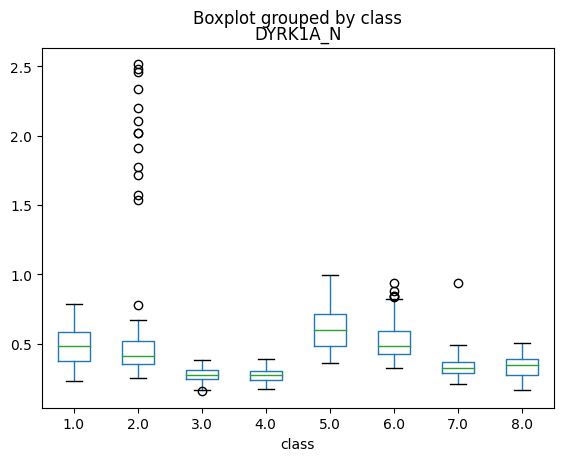

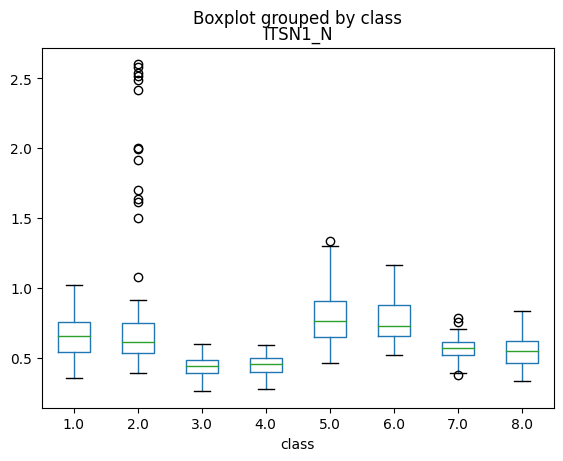

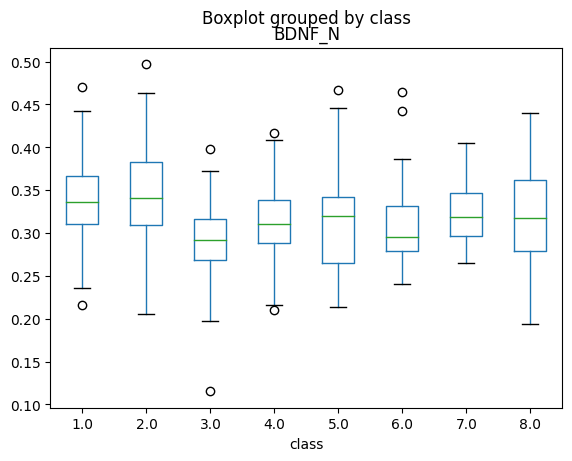

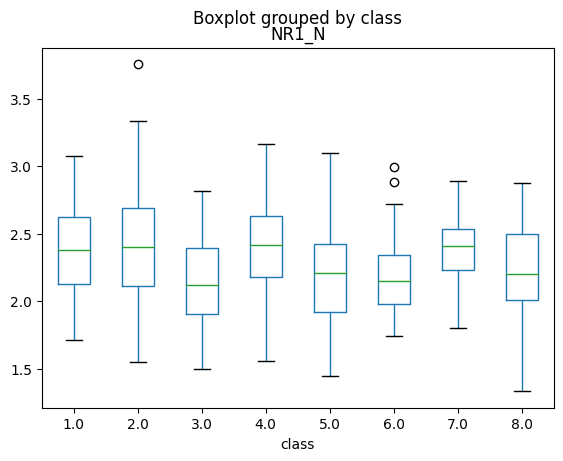

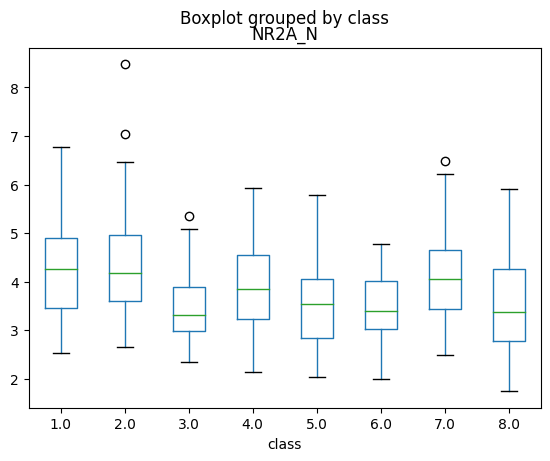

...

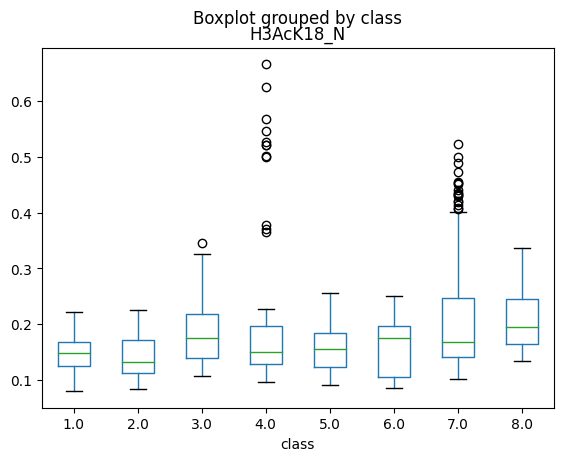

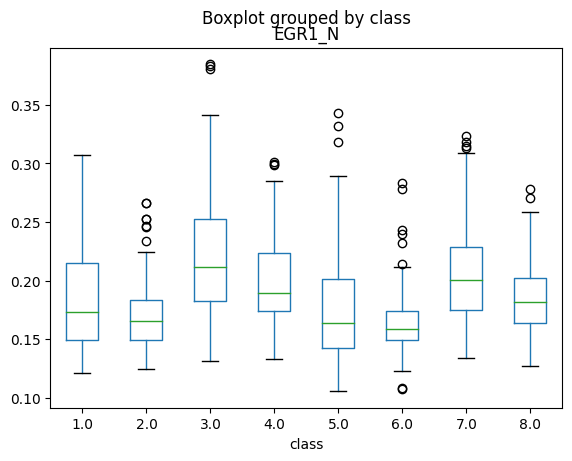

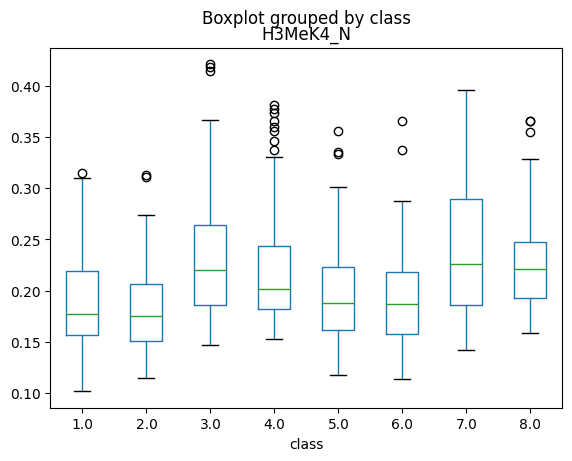

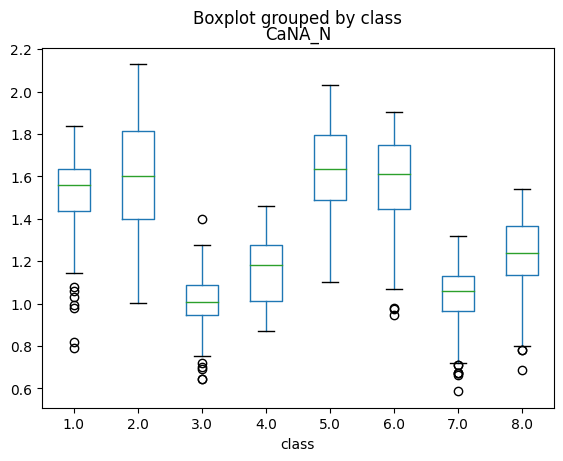

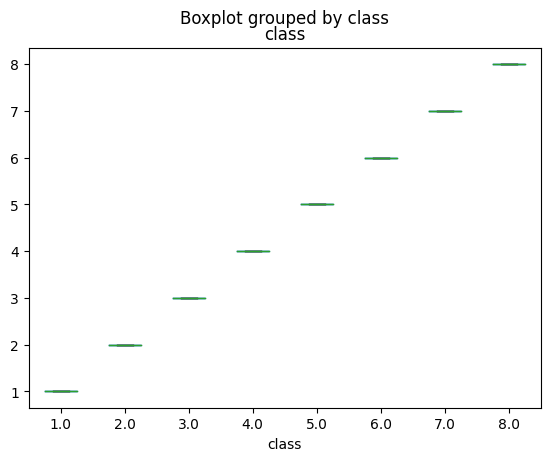

In [53]:
# Plot side-by-side boxplot for each variable to find which ones are likely to help predict classes

for col in df.columns.values:
  df.boxplot(by='class', column=col,grid=False)

normaling training data

,0,1,2,3,4,5,6,7,8,9,...,67,68,69,70,71,72,73,74,75,76
0,-0.110653,0.054726,0.790368,1.088284,0.912295,0.699246,0.227372,1.745129,0.988886,0.091581,...,-0.388191,-0.057948,-0.017916,-0.323241,0.311730,0.978107,-0.259136,-0.270016,-0.177435,-0.516048
1,0.417354,0.020241,-1.670110,-2.055627,-1.673660,-1.039923,-0.836024,-1.516559,-1.540237,-0.115997,...,1.062826,0.967718,0.143308,-1.692048,1.263237,-2.500080,-0.237175,1.100176,-0.102521,-0.735061
2,0.230576,-0.114261,-2.111696,-2.146613,-1.885920,-1.917539,-1.770262,-1.653334,-2.129657,-0.572250,...,0.121312,-0.002531,-0.320587,-1.423093,1.328735,-2.197769,-0.079529,-0.064362,0.264595,-0.315649
3,-0.178772,-0.120780,-1.582269,-1.577942,-1.399369,-1.528550,-0.929888,-1.373245,-0.731298,-0.363697,...,0.243211,0.061234,-0.265228,-1.677829,1.210418,-1.823667,0.275643,0.002084,0.683327,-0.800142
4,0.168155,0.191062,-0.475429,-0.115027,-0.535049,-0.670031,0.158535,-0.992916,-0.767559,-0.218042,...,-0.098701,-0.304603,-0.581726,-0.814256,-0.894069,-0.239360,-0.254653,-0.664477,-0.242074,0.948138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859,0.219899,0.145792,0.851787,0.537234,0.690666,-1.630514,-1.880740,-0.526052,-0.479001,-0.205240,...,0.338229,-0.768986,-0.800022,-0.096897,-0.693713,0.123958,-0.781298,-0.873290,-1.246302,0.832099
860,-0.200573,-0.157110,0.340424,1.017243,1.116732,0.084054,0.146005,-0.092032,0.205634,-0.015964,...,0.017863,-1.106642,-0.893704,1.152036,-0.839595,0.437025,-0.651128,-0.653704,-0.749237,-0.775356
861,1.286548,1.559916,1.530795,1.889662,1.059080,0.305099,0.173024,0.236820,0.954446,1.183879,...,0.428085,-0.569456,-1.052385,0.806850,-0.729112,0.962685,-0.295805,-1.014346,-1.111084,0.924972
862,-0.259970,-0.133728,2.053685,0.718647,0.741303,2.144294,1.045738,2.183053,1.157374,-0.021770,...,0.696283,0.905292,-0.286322,0.698774,-0.737912,0.740672,-0.063549,-0.467038,0.152901,-0.547654


0     2.364364e-16
1     3.176471e-16
2    -5.900630e-16
3     9.272418e-16
4    -8.532270e-17
          ...     
72    2.734438e-16
73    1.768133e-16
74   -2.055969e-17
75   -1.254141e-16
76   -2.796117e-16
Length: 77, dtype: float64


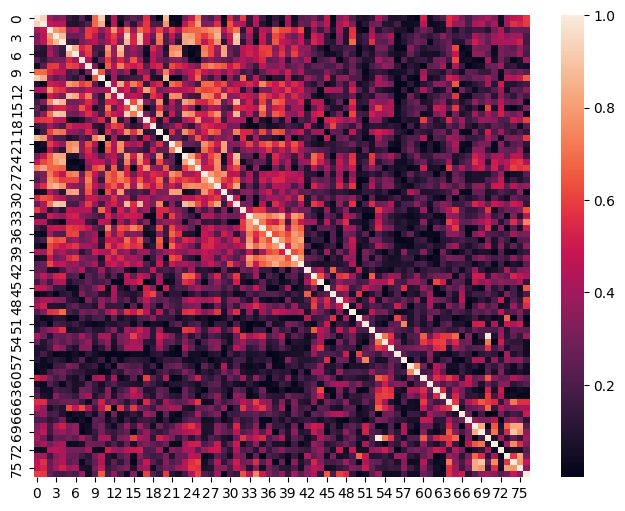

In [54]:
# Normalize data (shift and scale so that columns are zero mean and unit variance)
from sklearn import preprocessing

scaler = preprocessing.StandardScaler() # For data normalization
# X_train_scaled = X_train.drop(columns='Genotype')
# scaler.fit(X_train) # Compute mean and std
# X_train.drop(columns= ['DYRK1A_N', 'NR1_N','pS6_N'] )
scaler.fit(X_train) # Compute mean and std
# display(X_train)

X_train = pd.DataFrame(scaler.transform(X_train)) # Use mean and std
# W_train_Y = pd.DataFrame(W_train['quality'])
# y_train = W_train['quality']
display(X_train)
print(X_train.mean())

corrMatrix = X_train.corr(method='spearman') # Check correlation again
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(abs(corrMatrix), annot=False)
plt.show()

In [55]:
display(corrMatrix)

,0,1,2,3,4,5,6,7,8,9,...,67,68,69,70,71,72,73,74,75,76
0,1.000000,0.930113,0.401462,0.297949,0.338959,-0.146441,-0.094476,-0.224292,0.061590,0.685133,...,-0.190171,-0.319471,-0.359981,-0.423428,-0.319683,-0.057406,-0.405932,-0.470720,-0.480706,0.593747
1,0.930113,1.000000,0.481729,0.454137,0.466393,-0.095528,-0.079172,-0.130088,0.220834,0.685419,...,-0.197078,-0.429463,-0.470749,-0.287013,-0.428429,0.037454,-0.408050,-0.567168,-0.530895,0.586193
2,0.401462,0.481729,1.000000,0.786163,0.727956,0.384191,0.442337,0.258929,0.584748,0.549266,...,-0.117865,-0.172454,-0.162656,0.097597,-0.286653,0.436541,-0.161974,-0.251275,-0.262502,0.252955
3,0.297949,0.454137,0.786163,1.000000,0.875597,0.259969,0.262315,0.307782,0.593715,0.471420,...,-0.164002,-0.422833,-0.337810,0.261846,-0.382583,0.467353,-0.342895,-0.391851,-0.404100,0.181344
4,0.338959,0.466393,0.727956,0.875597,1.000000,0.163680,0.138315,0.306510,0.391834,0.454956,...,-0.278922,-0.512422,-0.378393,0.245522,-0.428405,0.422995,-0.418316,-0.433863,-0.519145,0.172523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,-0.057406,0.037454,0.436541,0.467353,0.422995,0.295361,0.303345,0.289189,0.395069,0.039067,...,-0.000761,0.085217,0.118871,0.392794,-0.023998,1.000000,0.036104,0.077802,0.061273,0.219230
73,-0.405932,-0.408050,-0.161974,-0.342895,-0.418316,0.269634,0.259464,0.169914,0.105477,-0.305424,...,0.306042,0.671997,0.541165,0.105793,0.402986,0.036104,1.000000,0.578242,0.812836,-0.278360
74,-0.470720,-0.567168,-0.251275,-0.391851,-0.433863,0.231551,0.282605,0.021652,-0.141016,-0.247039,...,0.388060,0.828807,0.894873,0.248356,0.756546,0.077802,0.578242,1.000000,0.784481,-0.483610
75,-0.480706,-0.530895,-0.262502,-0.404100,-0.519145,0.373174,0.411106,0.071887,0.064881,-0.296118,...,0.311440,0.826183,0.782002,0.134541,0.556284,0.061273,0.812836,0.784481,1.000000,-0.334280


## Training Random Forest Classifier model on data

In [56]:

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, f1_score

# f1_score, average='weighted' # You can choose 'micro', 'macro', or 'weighted'
scoring = 'accuracy'

rfc = RandomForestClassifier() # Now, we will try random forest
hyperparameters = {'max_depth':[5,10,15,20,None],'n_estimators':[10,30,70,100]}
clf = GridSearchCV(rfc, param_grid=hyperparameters,scoring=scoring)
clf.fit(np.array(X_train), np.squeeze(y_train))
print('Best parameters:')
print(clf.best_params_)
print('Best scoring'  + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(y_test), clf.predict(np.array(X_test))

from sklearn.metrics import classification_report

# Define classification report with zero_division parameter
print(classification_report(y_true, y_pred, zero_division=0))  # or zero_division="warn"




Best parameters:
{'max_depth': None, 'n_estimators': 100}
Best scoring: 0.9803132141416857
Test classification report:
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        32
         2.0       0.00      0.00      0.00        26
         3.0       0.00      0.00      0.00        27
         4.0       0.00      0.00      0.00        34
         5.0       0.00      0.00      0.00        19
         6.0       0.00      0.00      0.00        22
         7.0       0.00      0.00      0.00        25
         8.0       0.15      1.00      0.26        31

    accuracy                           0.14       216
   macro avg       0.02      0.12      0.03       216
weighted avg       0.02      0.14      0.04       216



In [57]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report
from sklearn.utils import shuffle
from imblearn.over_sampling import RandomOverSampler
import numpy as np

# Data augmentation using random oversampling
ros = RandomOverSampler()
train_X_resampled, train_Y_resampled = ros.fit_resample(X_train, y_train)

# Shuffle the data
train_X_resampled, train_Y_resampled = shuffle(train_X_resampled, train_Y_resampled)

rfc = RandomForestClassifier()  # Initialize the Random Forest Classifier
hyperparameters = {'max_depth': [2, 5, 10, 20], 'n_estimators': [10, 30, 100]}
scoring = 'accuracy'  # Adjust the scoring metric for multi-class classification
clf = GridSearchCV(rfc, param_grid=hyperparameters, scoring=scoring)

# Perform cross-validation to evaluate the model
cv_scores = cross_val_score(clf, np.array(train_X_resampled), np.squeeze(train_Y_resampled), cv=5)
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Fit the model
clf.fit(np.array(train_X_resampled), np.squeeze(train_Y_resampled))

print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(y_test), clf.predict(np.array(X_test))
print(classification_report(y_true, y_pred, zero_division=1))


Cross-Validation Accuracy Scores: [0.95939086 0.97461929 0.98984772 0.96446701 1.        ]
Mean CV Accuracy: 0.9776649746192894
Best parameters:
{'max_depth': 20, 'n_estimators': 100}
Best accuracy: 0.9868020304568528
Test classification report:
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        32
         2.0       1.00      0.00      0.00        26
         3.0       1.00      0.00      0.00        27
         4.0       1.00      0.00      0.00        34
         5.0       1.00      0.00      0.00        19
         6.0       1.00      0.00      0.00        22
         7.0       1.00      0.00      0.00        25
         8.0       0.14      1.00      0.25        31

    accuracy                           0.14       216
   macro avg       0.77      0.12      0.03       216
weighted avg       0.73      0.14      0.04       216



## Training SVC (with rbf kernel) model on data

In [58]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here
clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring)

clf.fit(np.array(X_train), np.squeeze(y_train))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(y_test), clf.predict(np.array(X_test))
print(classification_report(y_true, y_pred, zero_division=1))


Training SVC using GridSearchCV
Best parameters:
{'C': 10, 'degree': 3}
Best accuracy: 0.9976878612716764
Test classification report:
              precision    recall  f1-score   support

         1.0       0.31      0.88      0.46        32
         2.0       0.00      0.00      0.00        26
         3.0       1.00      0.00      0.00        27
         4.0       1.00      0.00      0.00        34
         5.0       0.60      0.16      0.25        19
         6.0       1.00      0.00      0.00        22
         7.0       0.00      0.00      0.00        25
         8.0       0.24      0.87      0.38        31

    accuracy                           0.27       216
   macro avg       0.52      0.24      0.14       216
weighted avg       0.52      0.27      0.14       216



In [59]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
import numpy as np

print('Training SVC using GridSearchCV')
scoring = 'accuracy'

# Feature Scaling
scaler = StandardScaler()
train_X_scaled = scaler.fit_transform(X_train)
test_X_scaled = scaler.transform(X_test)

# Data Augmentation using Random Oversampling
ros = RandomOverSampler()
train_X_resampled, train_Y_resampled = ros.fit_resample(train_X_scaled, y_train)

hyperparameters = {'C': [0.1, 1, 10], 'degree': [3, 5, 8]}
# These are the hyperparameters that we will try

svc = SVC(kernel='rbf')  # We specify the kernel here

# Use StratifiedKFold for cross-validation to ensure class balance in each fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

clf = GridSearchCV(estimator=svc, param_grid=hyperparameters, scoring=scoring, cv=cv)

clf.fit(np.array(train_X_resampled), np.squeeze(train_Y_resampled))
print('Best parameters:')
print(clf.best_params_)
print('Best ' + scoring + ": " + str(clf.best_score_))

print('Test classification report:')
y_true, y_pred = np.squeeze(y_test), clf.predict(test_X_scaled)
print(classification_report(y_true, y_pred,zero_division=0))


Training SVC using GridSearchCV


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Best parameters:
{'C': 1, 'degree': 3}
Best accuracy: 0.9979695431472081
Test classification report:
              precision    recall  f1-score   support

         1.0       0.32      0.88      0.47        32
         2.0       0.00      0.00      0.00        26
         3.0       0.00      0.00      0.00        27
         4.0       0.00      0.00      0.00        34
         5.0       0.50      0.16      0.24        19
         6.0       0.00      0.00      0.00        22
         7.0       0.00      0.00      0.00        25
         8.0       0.24      0.87      0.38        31

    accuracy                           0.27       216
   macro avg       0.13      0.24      0.14       216
weighted avg       0.13      0.27      0.14       216



recursive feature
elimination

Optimal number of features: 76


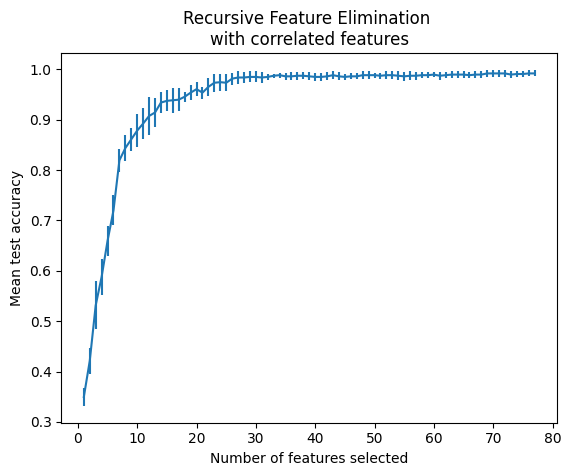

In [60]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

min_features_to_select = 1  # Minimum number of features to consider
clf = LogisticRegression(max_iter=1000)  # Increase max_iter
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X_train_scaled, y_train)

print(f"Optimal number of features: {rfecv.n_features_}")

n_scores = len(rfecv.cv_results_["mean_test_score"])
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.errorbar(
    range(min_features_to_select, n_scores + min_features_to_select),
    rfecv.cv_results_["mean_test_score"],
    yerr=rfecv.cv_results_["std_test_score"],
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()


# **Q3**

unmounting drive

In [63]:
from google.colab import drive
drive.flush_and_unmount()


Drive not mounted, so nothing to flush and unmount.


mounting drive

In [64]:
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


importing data from drive

In [65]:
import os

# List files in your Google Drive root directory
files = os.listdir('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/')
print(files)


['val', 'train']


code from the link mentioned in assignment

In [83]:
# License: BSD
# Author: Sasank Chilamkurthy

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory

cudnn.benchmark = True
plt.ion()   # interactive mode

## Load Data

We will use torchvision and torch.utils.data packages for loading the
data.

The problem we're going to solve today is to train a model to classify
**ants** and **bees**. We have about 120 training images each for ants and bees.
There are 75 validation images for each class. Usually, this is a very
small dataset to generalize upon, if trained from scratch. Since we
are using transfer learning, we should be able to generalize reasonably
well.

This dataset is a very small subset of imagenet.

.. Note ::
   Download the data from
   [here](https://download.pytorch.org/tutorial/hymenoptera_data.zip)
   and extract it to the current directory.



In [84]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/content/drive/My Drive/Colab Notebooks/hymenoptera_data/'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [85]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/content/drive/My Drive/Colab Notebooks/hymenoptera_data/'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Visualize a few images
Let's visualize a few training images so as to understand the data
augmentations.



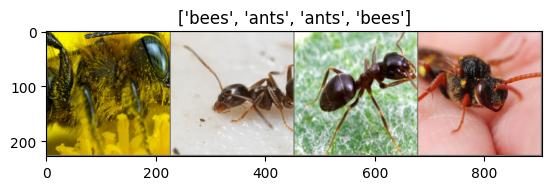

In [86]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

## Training the model

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [87]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

### Visualizing the model predictions

Generic function to display predictions for a few images




In [88]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

### Train and evaluate

It should take around 15-25 min on CPU. On GPU though, it takes less than a
minute.




## ConvNet as fixed feature extractor

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad = False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation
[here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward)_.




In [89]:
model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

### Train and evaluate

On CPU this will take about half the time compared to previous scenario.
This is expected as gradients don't need to be computed for most of the
network. However, forward does need to be computed.




In [90]:
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.5315 Acc: 0.7418
val Loss: 0.2615 Acc: 0.9020

Epoch 1/24
----------
train Loss: 0.5037 Acc: 0.7459
val Loss: 0.3371 Acc: 0.8497

Epoch 2/24
----------
train Loss: 0.5737 Acc: 0.7377
val Loss: 0.4874 Acc: 0.7778

Epoch 3/24
----------
train Loss: 0.5464 Acc: 0.7828
val Loss: 0.2079 Acc: 0.9216

Epoch 4/24
----------
train Loss: 0.6485 Acc: 0.7459
val Loss: 0.2640 Acc: 0.9020

Epoch 5/24
----------
train Loss: 0.4200 Acc: 0.8197
val Loss: 0.1885 Acc: 0.9346

Epoch 6/24
----------
train Loss: 0.4682 Acc: 0.8033
val Loss: 0.1955 Acc: 0.9412

Epoch 7/24
----------
train Loss: 0.3315 Acc: 0.8607
val Loss: 0.1964 Acc: 0.9477

Epoch 8/24
----------
train Loss: 0.3431 Acc: 0.8361
val Loss: 0.2394 Acc: 0.9150

Epoch 9/24
----------
train Loss: 0.2484 Acc: 0.9016
val Loss: 0.1999 Acc: 0.9412

Epoch 10/24
----------
train Loss: 0.3783 Acc: 0.8443
val Loss: 0.1906 Acc: 0.9477

Epoch 11/24
----------
train Loss: 0.2904 Acc: 0.8566
val Loss: 0.1825 Acc: 0.9477

Ep

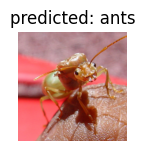

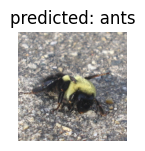

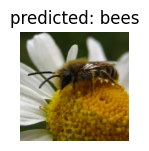

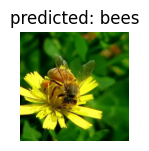

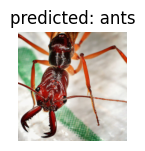

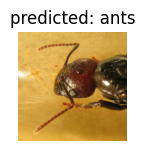

In [91]:
visualize_model(model_conv)

plt.ioff()
plt.show()

## Inference on custom images

Use the trained model to make predictions on custom images and visualize
the predicted class labels along with the images.




In [92]:
def visualize_model_predictions(model,img_path):
    was_training = model.training
    model.eval()

    img = Image.open(img_path)
    img = data_transforms['val'](img)
    img = img.unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        _, preds = torch.max(outputs, 1)

        ax = plt.subplot(2,2,1)
        ax.axis('off')
        ax.set_title(f'Predicted: {class_names[preds[0]]}')
        imshow(img.cpu().data[0])

        model.train(mode=was_training)

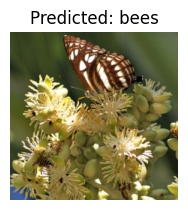

In [93]:
visualize_model_predictions(
    model_conv,
    img_path='/content/drive/My Drive/Colab Notebooks/hymenoptera_data/val/bees/72100438_73de9f17af.jpg'
)

plt.ioff()
plt.show()

function that outputs ResNet18 features for a given input image. Extract features for training
images

In [94]:
import os
import numpy as np

def extract_resnet18_features_from_folder(folder_path):
    # Define preprocessing transform
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Load pre-trained ResNet18 model
    model = models.resnet18(pretrained=True)
    model.eval()  # Set the model to evaluation mode

    # Remove the last fully connected layer
    model = torch.nn.Sequential(*(list(model.children())[:-1]))

    all_features = []

    # List all image files in the directory
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct full path to image
            image_path = os.path.join(folder_path, filename)

            # Load the image
            image = Image.open(image_path).convert('RGB')

            # Apply preprocessing transform
            image_tensor = preprocess(image)
            image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension

            # Forward pass to extract features
            with torch.no_grad():
                features = model(image_tensor)

            # Flatten the features and convert to numpy array
            features = features.squeeze().numpy()
            all_features.append(features)

    # Convert list of features arrays to a single numpy array
    all_features = np.stack(all_features)

    return all_features

# Example usage
folder_path = '/content/drive/My Drive/Colab Notebooks/hymenoptera_data/train/ants'
features = extract_resnet18_features_from_folder(folder_path)
print("Shape of features array:", features.shape)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Shape of features array: (123, 512)


importing images from drive and training model

In [95]:
import os
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

# Define a function to load labels from a folder
def load_labels_from_folder(folder_path, label):
    labels = []
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            labels.append(label)
    return labels

# Load features and labels from the first folder
folder1_features = extract_resnet18_features_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/train/ants')
folder1_labels = load_labels_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/train/ants', label='ant')  # Assign label 'class1' to all images in folder1

# Load features and labels from the second folder
folder2_features = extract_resnet18_features_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/train/bees')
folder2_labels = load_labels_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/train/bees', label='bee')  # Assign label 'class2' to all images in folder2

# Concatenate features and labels from both folders
# all_features = np.concatenate((folder1_features, folder2_features), axis=0)
# all_labels = np.concatenate((folder1_labels, folder2_labels), axis=0)

if folder1_features.size > 0 and folder2_features.size > 0:
    all_features = np.concatenate((folder1_features, folder2_features), axis=0)
    all_labels = np.concatenate((folder1_labels, folder2_labels), axis=0)
elif folder1_features.size > 0:
    all_features = folder1_features
    all_labels = folder1_labels
elif folder2_features.size > 0:
    all_features = folder2_features
    all_labels = folder2_labels
else:
    raise ValueError("Both folders contain empty features")



# Split the data into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(all_features, all_labels, test_size=0.2, random_state=42)

X_train = all_features
y_train = all_labels

# Define parameter grids for grid search
svm_param_grid = {'C': [0.1, 1, 10, 100],
                  'gamma': [0.001, 0.01, 0.1, 1, 10]}

rf_param_grid = {'n_estimators': [50, 100, 200],
                 'max_depth': [None, 10, 20, 30]}

# Perform grid search for SVM
svm_grid_search = GridSearchCV(SVC(kernel='rbf'), svm_param_grid, cv=5)
svm_grid_search.fit(X_train, y_train)

# Perform grid search for Random Forest
rf_grid_search = GridSearchCV(RandomForestClassifier(), rf_param_grid, cv=5)
rf_grid_search.fit(X_train, y_train)

# Get the best models from grid search
best_svm = svm_grid_search.best_estimator_
best_rf = rf_grid_search.best_estimator_



importing images for testing

In [96]:
# Load features and labels from the first folder
folder3_features = extract_resnet18_features_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/val/ants')
folder3_labels = load_labels_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/val/ants', label='ant')  # Assign label 'class1' to all images in folder1

# Load features and labels from the second folder
folder4_features = extract_resnet18_features_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/val/bees')
folder4_labels = load_labels_from_folder('/content/drive/My Drive/Colab Notebooks/hymenoptera_data/val/bees', label='bee')  # Assign label 'class2' to all images in folder2

if folder3_features.size > 0 and folder4_features.size > 0:
    all_features = np.concatenate((folder3_features, folder4_features), axis=0)
    all_labels = np.concatenate((folder3_labels, folder4_labels), axis=0)
elif folder3_features.size > 0:
    all_features = folder3_features
    all_labels = folder3_labels
elif folder4_features.size > 0:
    all_features = folder4_features
    all_labels = folder4_labels
else:
    raise ValueError("Both folders contain empty features")

X_test = all_features
y_test = all_labels



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


testing model

In [97]:
# Evaluate the best models on test data
svm_pred = best_svm.predict(X_test)
rf_pred = best_rf.predict(X_test)

# Calculate accuracy and F1 score
svm_accuracy = accuracy_score(y_test, svm_pred)
svm_f1 = f1_score(y_test, svm_pred, average='weighted')

rf_accuracy = accuracy_score(y_test, rf_pred)
rf_f1 = f1_score(y_test, rf_pred, average='weighted')

print("SVM - Accuracy: {:.4f}, F1 Score: {:.4f}".format(svm_accuracy, svm_f1))
print("Random Forest - Accuracy: {:.4f}, F1 Score: {:.4f}".format(rf_accuracy, rf_f1))


SVM - Accuracy: 0.9542, F1 Score: 0.9543
Random Forest - Accuracy: 0.9477, F1 Score: 0.9477


**Q4**

In [98]:

! pip install streamlit -q

generates file to be updloaded on server

In [99]:
%%writefile Red_wine_quality_predictor.py
import streamlit as st
import joblib



# Load the trained regression model
model = joblib.load("Red_wine_random_forest_model.pkl")

# Define the user interface
st.title("RED Wine Quality Predictor")
st.sidebar.header("Input Parameters")

fixed_acidity = st.sidebar.slider("Fixed Acidity", min_value=4.0, max_value=16.0, value=8.5, key="fixed_acidity_slider")
volatile_acidity = st.sidebar.slider("Volatile Acidity", min_value=0.10, max_value=1.60, value=0.53, key="volatile_acidity_slider")
citric_acid = st.sidebar.slider("Citric Acid", min_value=0.000, max_value=1.000, value=0.271, key="citric_acid_slider")
residual_sugar = st.sidebar.slider("Residual Sugar", min_value=0.7, max_value=16.0, value=2.5, key="residual_sugar_slider")
chlorides = st.sidebar.slider("Chlorides", min_value=0.000, max_value=0.800, value=0.087, key="chlorides_slider")
free_sulfur_dioxide = st.sidebar.slider("Free Sulfur Dioxide", min_value=0.0, max_value=75.0, value=16.0, key="free_sulfur_dioxide_slider")
total_sulfur_dioxide = st.sidebar.slider("Total Sulfur Dioxide", min_value=0.0, max_value=300.0, value=50.0, key="total_sulfur_dioxide_slider")
density = st.sidebar.slider("Density", min_value=0.800, max_value=1.100, value=1.004, key="density_slider")
pH = st.sidebar.slider("pH", min_value=2.5, max_value=4.5, value=3.3, key="ph_slider")
sulphates = st.sidebar.slider("Sulphates", min_value=0.30, max_value=3.00, value=0.65, key="sulphates_slider")
alcohol = st.sidebar.slider("Alcohol", min_value=6.0, max_value=17.0, value=10.5, key="alcohol_slider")



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

red_wine_data = pd.read_csv('winequality-red.csv', delimiter=';')
# display(red_wine_data)

# Splitting data into training and testing sets
R_train,R_test = train_test_split(red_wine_data, test_size=0.2, random_state=42)

# Normalize data (shift and scale so that columns are zero mean and unit variance)
from sklearn import preprocessing

scaler = preprocessing.StandardScaler() # For data normalization

scaler.fit(R_train.drop(columns=['quality'])) # Compute mean and std
R_train_X = pd.DataFrame(scaler.transform(R_train.drop(columns=['quality']))) # Use mean and std

# Make predictions
input_features = [[fixed_acidity, volatile_acidity, citric_acid, residual_sugar, chlorides, free_sulfur_dioxide, total_sulfur_dioxide, density, pH, sulphates, alcohol]]
R_test_X = pd.DataFrame(scaler.transform(input_features))
quality = model.predict(R_test_X)

# Display the predicted wine quality
st.subheader("Predicted Wine Quality")
st.write(f"The predicted wine quality is: {quality[0]}")


Overwriting Red_wine_quality_predictor.py


to run streamlit

In [100]:

!wget -q -O - ipv4.icanhazip.com

34.125.121.77


In [101]:

! streamlit run Red_wine_quality_predictor.py & npx localtunnel --port 8501




  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.125.121.77:8501

npx: installed 22 in 2.759s
your url is: https://common-sides-stand.loca.lt
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
  Stopping...
^C


#**References**
1. demo code provided by sir
2. chat gpt
3. gemini
4. https://scikit-learn.org/stable/index.html
5. youtube : https://youtu.be/ZZsyxIWdCko?si=Nf4iSzmtbIlKqoWD
6.https://www.analyticsvidhya.com/blog/2020/10/feature-selection-techniques-in-machine-learning/
